In [20]:
# ============================================================
# IMPORT ALL REQUIRED LIBRARIES
# ============================================================

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
from pathlib import Path
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

# Deep Learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import EfficientNetB0, ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Metrics & Visualization
import sklearn
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils.class_weight import compute_class_weight

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

print("="*60)
print("PACKAGE VERSIONS")
print("="*60)
print(f"✓ TensorFlow: {tf.__version__}")
print(f"✓ NumPy: {np.__version__}")
print(f"✓ Pandas: {pd.__version__}")
print(f"✓ OpenCV: {cv2.__version__}")
print(f"✓ Scikit-learn: {sklearn.__version__}")
print(f"✓ Matplotlib: {matplotlib.__version__}")
print(f"✓ Seaborn: {sns.__version__}")
print("="*60)

# Check GPU
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"\n✓ GPU available: {len(gpus)} device(s)")
    for gpu in gpus:
        print(f"  - {gpu.name}")
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("✓ GPU memory growth enabled")
    except RuntimeError as e:
        print(f"⚠️ GPU configuration error: {e}")
else:
    print(f"\n⚠️ No GPU detected, using CPU")

print("\n" + "="*60)
print("✓ ALL LIBRARIES LOADED SUCCESSFULLY!")
print("="*60)

PACKAGE VERSIONS
✓ TensorFlow: 2.15.0
✓ NumPy: 1.24.3
✓ Pandas: 2.0.3
✓ OpenCV: 4.8.0
✓ Scikit-learn: 1.3.0
✓ Matplotlib: 3.7.2
✓ Seaborn: 0.12.2

⚠️ No GPU detected, using CPU

✓ ALL LIBRARIES LOADED SUCCESSFULLY!


In [21]:
# Define dataset paths
# BASE_PATH = 'C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification'
BASE_PATH = r'C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification'
TRAIN_PATH = os.path.join(BASE_PATH, 'train')
VAL_PATH = os.path.join(BASE_PATH, 'val')
TEST_PATH = os.path.join(BASE_PATH, 'test')

# Verify paths exist
print("="*60)
print("CHECKING DATASET PATHS")
print("="*60)

all_valid = True
for path_name, path in [('Train', TRAIN_PATH), ('Val', VAL_PATH), ('Test', TEST_PATH)]:
    exists = os.path.exists(path)
    status = "✓" if exists else "✗"
    print(f"{status} {path_name:10s}: {path}")
    if not exists:
        all_valid = False

if not all_valid:
    print("\n⚠️ ERROR: Some dataset paths not found!")
    print(f"Please update BASE_PATH in the cell above")
    print(f"Current BASE_PATH: {BASE_PATH}")
    raise FileNotFoundError("Dataset paths invalid - please fix BASE_PATH")

print("\n✓ All dataset paths valid!")

# Load class names
class_names = sorted([d for d in os.listdir(TRAIN_PATH) 
                      if os.path.isdir(os.path.join(TRAIN_PATH, d))])

print(f"\n✓ Total classes: {len(class_names)}")

if len(class_names) == 31:
    print("✓ All 31 fish species loaded correctly!")
else:
    print(f"⚠️ Expected 31 classes, found {len(class_names)}")

print(f"\nFirst 10 classes:")
for i, cls in enumerate(class_names[:10], 1):
    print(f"  {i:2d}. {cls}")

print(f"\nLast 5 classes:")
for i, cls in enumerate(class_names[-5:], len(class_names)-4):
    print(f"  {i:2d}. {cls}")

CHECKING DATASET PATHS
✓ Train     : C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\train
✓ Val       : C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\val
✓ Test      : C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\test

✓ All dataset paths valid!

✓ Total classes: 31
✓ All 31 fish species loaded correctly!

First 10 classes:
   1. Bangus
   2. Big Head Carp
   3. Black Spotted Barb
   4. Catfish
   5. Climbing Perch
   6. Fourfinger Threadfin
   7. Freshwater Eel
   8. Glass Perchlet
   9. Goby
  10. Gold Fish

Last 5 classes:
  27. Silver Carp
  28. Silver Perch
  29. Snakehead
  30. Tenpounder
  31. Tilapia


In [22]:
# ============================================================
# DATASET ANALYSIS
# ============================================================

def analyze_dataset(dataset_path, split_name):
    """
    Analyze dataset: count images per class, resolution distribution
    """
    print(f"\n{'='*60}")
    print(f"ANALYZING {split_name.upper()} DATASET")
    print(f"{'='*60}")
    
    class_counts = {}
    image_sizes = []
    total_images = 0
    
    for class_name in class_names:
        class_path = os.path.join(dataset_path, class_name)
        if os.path.isdir(class_path):
            # Count images
            images = [f for f in os.listdir(class_path) 
                     if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            class_counts[class_name] = len(images)
            total_images += len(images)
            
            # Sample 10 images to check resolution
            for img_file in images[:10]:
                img_path = os.path.join(class_path, img_file)
                try:
                    img = cv2.imread(img_path)
                    if img is not None:
                        image_sizes.append((img.shape[1], img.shape[0]))
                except:
                    pass
    
    # Print statistics
    print(f"\nTotal images: {total_images}")
    print(f"\nClass distribution:")
    
    # Sort by count
    sorted_counts = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
    for class_name, count in sorted_counts:
        percentage = (count/total_images)*100
        print(f"  {class_name:30s}: {count:4d} images ({percentage:5.2f}%)")
    
    # Image size analysis
    if image_sizes:
        widths, heights = zip(*image_sizes)
        print(f"\nImage resolution statistics (from {len(image_sizes)} samples):")
        print(f"  Width  - Min: {min(widths):4d}, Max: {max(widths):4d}, Avg: {np.mean(widths):.0f}")
        print(f"  Height - Min: {min(heights):4d}, Max: {max(heights):4d}, Avg: {np.mean(heights):.0f}")
    
    return class_counts, image_sizes

# Analyze all splits
train_counts, train_sizes = analyze_dataset(TRAIN_PATH, 'train')
val_counts, val_sizes = analyze_dataset(VAL_PATH, 'validation')
test_counts, test_sizes = analyze_dataset(TEST_PATH, 'test')


ANALYZING TRAIN DATASET

Total images: 8801

Class distribution:
  Grass Carp                    : 1222 images (13.88%)
  Goby                          :  607 images ( 6.90%)
  Glass Perchlet                :  397 images ( 4.51%)
  Silver Barb                   :  329 images ( 3.74%)
  Knifefish                     :  319 images ( 3.62%)
  Catfish                       :  314 images ( 3.57%)
  Gourami                       :  311 images ( 3.53%)
  Tilapia                       :  294 images ( 3.34%)
  Perch                         :  293 images ( 3.33%)
  Janitor Fish                  :  286 images ( 3.25%)
  Silver Perch                  :  283 images ( 3.22%)
  Tenpounder                    :  277 images ( 3.15%)
  Freshwater Eel                :  271 images ( 3.08%)
  Indian Carp                   :  262 images ( 2.98%)
  Long-Snouted Pipefish         :  256 images ( 2.91%)
  Mosquito Fish                 :  254 images ( 2.89%)
  Silver Carp                   :  238 images ( 2.70%)

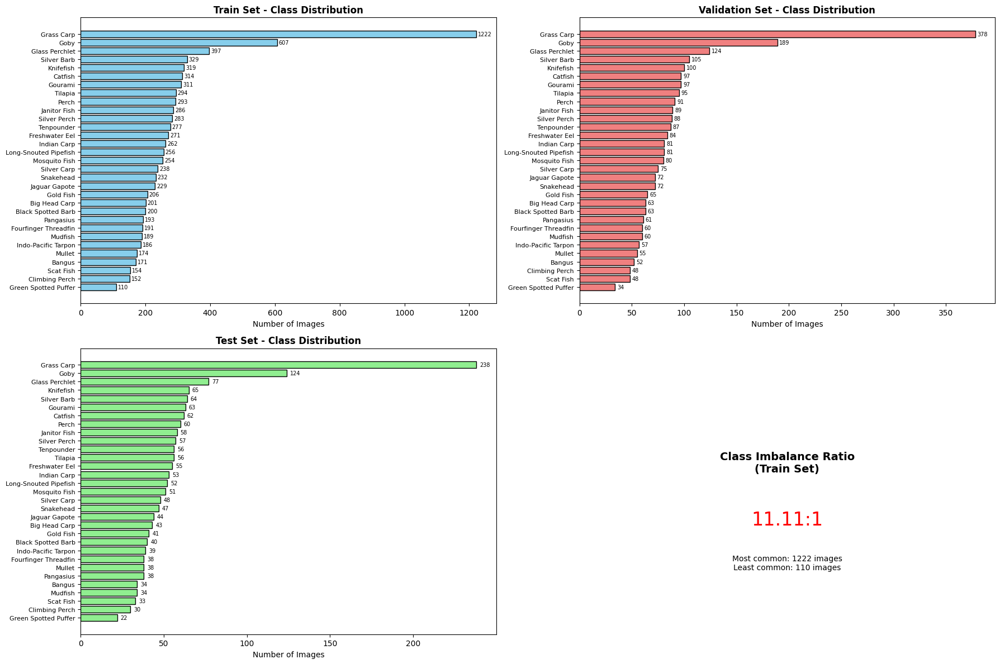


CLASS IMBALANCE ANALYSIS
Imbalance Ratio: 11.11:1
⚠️  SEVERE IMBALANCE - Class weights REQUIRED!


In [23]:
# ============================================================
# VISUALIZE CLASS DISTRIBUTION
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# 1. Train distribution
ax1 = axes[0, 0]
sorted_train = sorted(train_counts.items(), key=lambda x: x[1], reverse=True)
classes, counts = zip(*sorted_train)
ax1.barh(range(len(classes)), counts, color='skyblue', edgecolor='black')
ax1.set_yticks(range(len(classes)))
ax1.set_yticklabels(classes, fontsize=8)
ax1.set_xlabel('Number of Images', fontsize=10)
ax1.set_title('Train Set - Class Distribution', fontsize=12, fontweight='bold')
ax1.invert_yaxis()
for i, count in enumerate(counts):
    ax1.text(count + 5, i, str(count), va='center', fontsize=7)

# 2. Validation distribution
ax2 = axes[0, 1]
sorted_val = sorted(val_counts.items(), key=lambda x: x[1], reverse=True)
classes_val, counts_val = zip(*sorted_val)
ax2.barh(range(len(classes_val)), counts_val, color='lightcoral', edgecolor='black')
ax2.set_yticks(range(len(classes_val)))
ax2.set_yticklabels(classes_val, fontsize=8)
ax2.set_xlabel('Number of Images', fontsize=10)
ax2.set_title('Validation Set - Class Distribution', fontsize=12, fontweight='bold')
ax2.invert_yaxis()
for i, count in enumerate(counts_val):
    ax2.text(count + 2, i, str(count), va='center', fontsize=7)

# 3. Test distribution
ax3 = axes[1, 0]
sorted_test = sorted(test_counts.items(), key=lambda x: x[1], reverse=True)
classes_test, counts_test = zip(*sorted_test)
ax3.barh(range(len(classes_test)), counts_test, color='lightgreen', edgecolor='black')
ax3.set_yticks(range(len(classes_test)))
ax3.set_yticklabels(classes_test, fontsize=8)
ax3.set_xlabel('Number of Images', fontsize=10)
ax3.set_title('Test Set - Class Distribution', fontsize=12, fontweight='bold')
ax3.invert_yaxis()
for i, count in enumerate(counts_test):
    ax3.text(count + 2, i, str(count), va='center', fontsize=7)

# 4. Class imbalance ratio
ax4 = axes[1, 1]
imbalance_ratio = max(counts) / min(counts)
ax4.text(0.5, 0.6, f'Class Imbalance Ratio\n(Train Set)', 
         ha='center', va='center', fontsize=14, fontweight='bold')
ax4.text(0.5, 0.4, f'{imbalance_ratio:.2f}:1', 
         ha='center', va='center', fontsize=24, color='red')
ax4.text(0.5, 0.25, f'Most common: {max(counts)} images\nLeast common: {min(counts)} images', 
         ha='center', va='center', fontsize=10)
ax4.axis('off')

plt.tight_layout()
plt.show()

print(f"\n{'='*60}")
print(f"CLASS IMBALANCE ANALYSIS")
print(f"{'='*60}")
print(f"Imbalance Ratio: {imbalance_ratio:.2f}:1")
if imbalance_ratio > 3:
    print("⚠️  SEVERE IMBALANCE - Class weights REQUIRED!")
elif imbalance_ratio > 1.5:
    print("⚠️  MODERATE IMBALANCE - Class weights recommended")
else:
    print("✓ Balanced dataset")

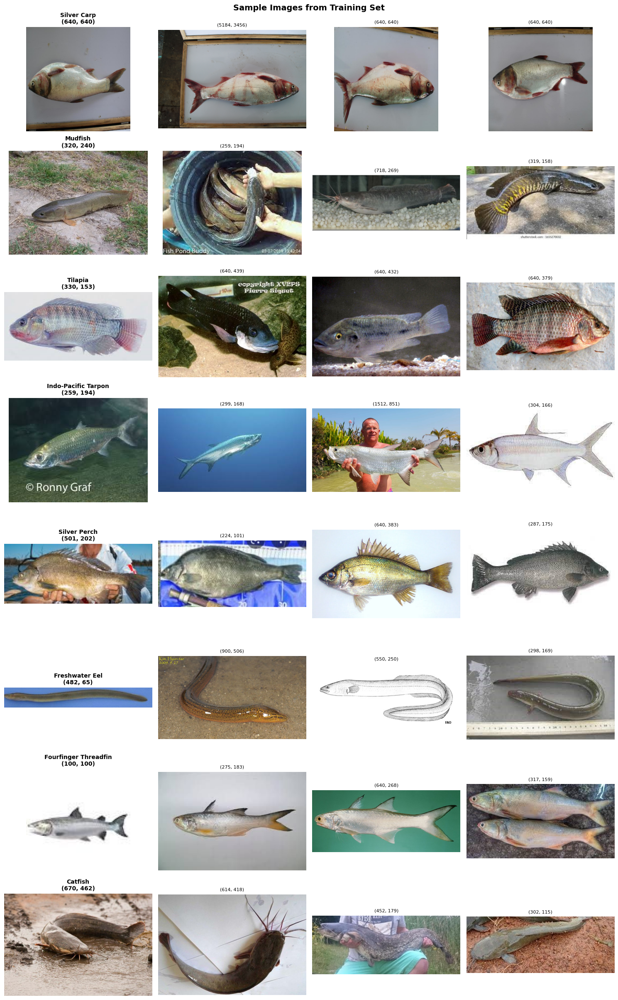

In [24]:
# ============================================================
# VISUALIZE SAMPLE IMAGES
# ============================================================

def plot_sample_images(dataset_path, num_classes=8, samples_per_class=4):
    """
    Plot sample images from random classes
    """
    import random
    
    selected_classes = random.sample(class_names, min(num_classes, len(class_names)))
    
    fig, axes = plt.subplots(num_classes, samples_per_class, 
                             figsize=(15, 3*num_classes))
    
    for i, class_name in enumerate(selected_classes):
        class_path = os.path.join(dataset_path, class_name)
        images = [f for f in os.listdir(class_path) 
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        
        sample_images = random.sample(images, min(samples_per_class, len(images)))
        
        for j, img_file in enumerate(sample_images):
            img_path = os.path.join(class_path, img_file)
            img = load_img(img_path)
            
            ax = axes[i, j] if num_classes > 1 else axes[j]
            ax.imshow(img)
            ax.axis('off')
            if j == 0:
                ax.set_title(f'{class_name}\n{img.size}', 
                           fontsize=10, fontweight='bold')
            else:
                ax.set_title(f'{img.size}', fontsize=8)
    
    plt.tight_layout()
    plt.suptitle('Sample Images from Training Set', 
                 fontsize=14, fontweight='bold', y=1.002)
    plt.show()

plot_sample_images(TRAIN_PATH, num_classes=8, samples_per_class=4)

In [25]:
# ============================================================
# CONFIGURATION - HYPERPARAMETERS
# ============================================================

# Image parameters
IMG_HEIGHT = 224
IMG_WIDTH = 224
IMG_CHANNELS = 3
IMG_SIZE = (IMG_HEIGHT, IMG_WIDTH)

# Training parameters
BATCH_SIZE = 32
EPOCHS_SCRATCH = 50
EPOCHS_TRANSFER_STAGE1 = 5
EPOCHS_TRANSFER_STAGE2 = 15

# Number of classes
NUM_CLASSES = 31

# Random seed
SEED = 42

# Model save directory
MODEL_SAVE_DIR = os.path.join(BASE_PATH, 'models')
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

print("="*60)
print("CONFIGURATION SUMMARY")
print("="*60)
print(f"\nImage Configuration:")
print(f"  Size: {IMG_WIDTH}x{IMG_HEIGHT}")
print(f"  Channels: {IMG_CHANNELS}")

print(f"\nTraining Configuration:")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  CNN Scratch epochs: {EPOCHS_SCRATCH}")
print(f"  Transfer Learning:")
print(f"    - Stage 1 (freeze): {EPOCHS_TRANSFER_STAGE1} epochs")
print(f"    - Stage 2 (fine-tune): {EPOCHS_TRANSFER_STAGE2} epochs")

print(f"\nDataset Configuration:")
print(f"  Number of classes: {NUM_CLASSES}")
print(f"  Training path: {TRAIN_PATH}")
print(f"  Validation path: {VAL_PATH}")
print(f"  Test path: {TEST_PATH}")

print(f"\nModel Save Configuration:")
print(f"  Save directory: {MODEL_SAVE_DIR}")
print(f"  Directory exists: {os.path.exists(MODEL_SAVE_DIR)}")

print(f"\nRandom seed: {SEED}")
print("="*60)
print("✓ CONFIGURATION COMPLETE!")
print("="*60)

CONFIGURATION SUMMARY

Image Configuration:
  Size: 224x224
  Channels: 3

Training Configuration:
  Batch size: 32
  CNN Scratch epochs: 50
  Transfer Learning:
    - Stage 1 (freeze): 5 epochs
    - Stage 2 (fine-tune): 15 epochs

Dataset Configuration:
  Number of classes: 31
  Training path: C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\train
  Validation path: C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\val
  Test path: C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\test

Model Save Configuration:
  Save directory: C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\models
  Directory exists: True

Random seed: 42
✓ CONFIGURATION COMPLETE!


In [26]:
# ============================================================
# DATA AUGMENTATION STRATEGY
# ============================================================

print("="*60)
print("SETTING UP DATA GENERATORS")
print("="*60)

# TRAINING GENERATOR - AGGRESSIVE AUGMENTATION
train_datagen = ImageDataGenerator(
    rescale=1./255,                    # Normalize pixel values to [0,1]
    rotation_range=30,                 # Random rotation ±30 degrees
    width_shift_range=0.2,             # Horizontal shift 20%
    height_shift_range=0.2,            # Vertical shift 20%
    shear_range=0.2,                   # Shear transformation
    zoom_range=0.2,                    # Random zoom 80%-120%
    horizontal_flip=True,              # Mirror flip (ikan bisa kiri/kanan)
    vertical_flip=False,               # NO vertical flip (ikan jarang terbalik)
    brightness_range=[0.8, 1.2],       # Brightness adjustment
    fill_mode='nearest'                # Fill pixels after transformations
)

# VALIDATION/TEST GENERATOR - ONLY RESCALING
val_test_datagen = ImageDataGenerator(
    rescale=1./255                     # Only normalize, NO augmentation
)

print("\n✓ Data generators configured")
print("\nTraining augmentation strategy:")
print("  - Rotation: ±30°")
print("  - Shift: ±20%")
print("  - Zoom: 80%-120%")
print("  - Brightness: 80%-120%")
print("  - Horizontal flip: Yes")
print("  - Shear: 0.2")
print("\nValidation/Test: Only rescaling (no augmentation)")

SETTING UP DATA GENERATORS

✓ Data generators configured

Training augmentation strategy:
  - Rotation: ±30°
  - Shift: ±20%
  - Zoom: 80%-120%
  - Brightness: 80%-120%
  - Horizontal flip: Yes
  - Shear: 0.2

Validation/Test: Only rescaling (no augmentation)


In [27]:
# ============================================================
# CREATE DATA GENERATORS FROM DIRECTORIES
# ============================================================

print("\n" + "="*60)
print("LOADING DATASETS")
print("="*60)

# Training generator
train_generator = train_datagen.flow_from_directory(
    TRAIN_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',          # Multi-class classification
    shuffle=True,                      # Shuffle untuk better training
    seed=SEED
)

# Validation generator
val_generator = val_test_datagen.flow_from_directory(
    VAL_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,                     # NO shuffle untuk consistent evaluation
    seed=SEED
)

# Test generator
test_generator = val_test_datagen.flow_from_directory(
    TEST_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,                     # NO shuffle untuk consistent evaluation
    seed=SEED
)

print(f"\n✓ Training samples: {train_generator.samples}")
print(f"✓ Validation samples: {val_generator.samples}")
print(f"✓ Test samples: {test_generator.samples}")

print(f"\n✓ Training batches: {len(train_generator)}")
print(f"✓ Validation batches: {len(val_generator)}")
print(f"✓ Test batches: {len(test_generator)}")

# Get class indices mapping
class_indices = train_generator.class_indices
print(f"\n✓ Class indices mapping created ({len(class_indices)} classes)")


LOADING DATASETS
Found 8801 images belonging to 31 classes.
Found 2751 images belonging to 31 classes.
Found 1760 images belonging to 31 classes.

✓ Training samples: 8801
✓ Validation samples: 2751
✓ Test samples: 1760

✓ Training batches: 276
✓ Validation batches: 86
✓ Test batches: 55

✓ Class indices mapping created (31 classes)


In [28]:
# ============================================================
# COMPUTE CLASS WEIGHTS FOR IMBALANCED DATA
# ============================================================

print("\n" + "="*60)
print("COMPUTING CLASS WEIGHTS")
print("="*60)

# Get training labels
train_labels = train_generator.classes

# Create reverse mapping (index -> class name) - TAMBAHKAN INI
class_indices = train_generator.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}

# Compute class weights using sklearn
class_weights_array = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_labels),
    y=train_labels
)

# Convert to dictionary format for Keras
class_weights_dict = {i: weight for i, weight in enumerate(class_weights_array)}

# Display class weights
print("\nClass weights (Top 5 highest and lowest):\n")

# Sort by weight
sorted_weights = sorted(class_weights_dict.items(), key=lambda x: x[1], reverse=True)

print("TOP 5 HIGHEST WEIGHTS (Minority classes):")
for idx, weight in sorted_weights[:5]:
    class_name = idx_to_class[idx]
    count = np.sum(train_labels == idx)
    print(f"  {class_name:30s} - Weight: {weight:.3f} (n={count})")

print("\nTOP 5 LOWEST WEIGHTS (Majority classes):")
for idx, weight in sorted_weights[-5:]:
    class_name = idx_to_class[idx]
    count = np.sum(train_labels == idx)
    print(f"  {class_name:30s} - Weight: {weight:.3f} (n={count})")

# Calculate weight statistics
weights_values = list(class_weights_dict.values())
print(f"\nWeight statistics:")
print(f"  Min weight: {min(weights_values):.3f}")
print(f"  Max weight: {max(weights_values):.3f}")
print(f"  Weight ratio: {max(weights_values)/min(weights_values):.2f}:1")
print(f"  Mean weight: {np.mean(weights_values):.3f}")

print("\n✓ Class weights computed successfully!")
print("  → Minority classes akan mendapat loss penalty lebih tinggi")
print("  → Model akan focus lebih ke rare fish species")    


COMPUTING CLASS WEIGHTS

Class weights (Top 5 highest and lowest):

TOP 5 HIGHEST WEIGHTS (Minority classes):
  Green Spotted Puffer           - Weight: 2.581 (n=110)
  Climbing Perch                 - Weight: 1.868 (n=152)
  Scat Fish                      - Weight: 1.844 (n=154)
  Bangus                         - Weight: 1.660 (n=171)
  Mullet                         - Weight: 1.632 (n=174)

TOP 5 LOWEST WEIGHTS (Majority classes):
  Knifefish                      - Weight: 0.890 (n=319)
  Silver Barb                    - Weight: 0.863 (n=329)
  Glass Perchlet                 - Weight: 0.715 (n=397)
  Goby                           - Weight: 0.468 (n=607)
  Grass Carp                     - Weight: 0.232 (n=1222)

Weight statistics:
  Min weight: 0.232
  Max weight: 2.581
  Weight ratio: 11.11:1
  Mean weight: 1.217

✓ Class weights computed successfully!
  → Minority classes akan mendapat loss penalty lebih tinggi
  → Model akan focus lebih ke rare fish species



VISUALIZING AUGMENTATION EFFECTS


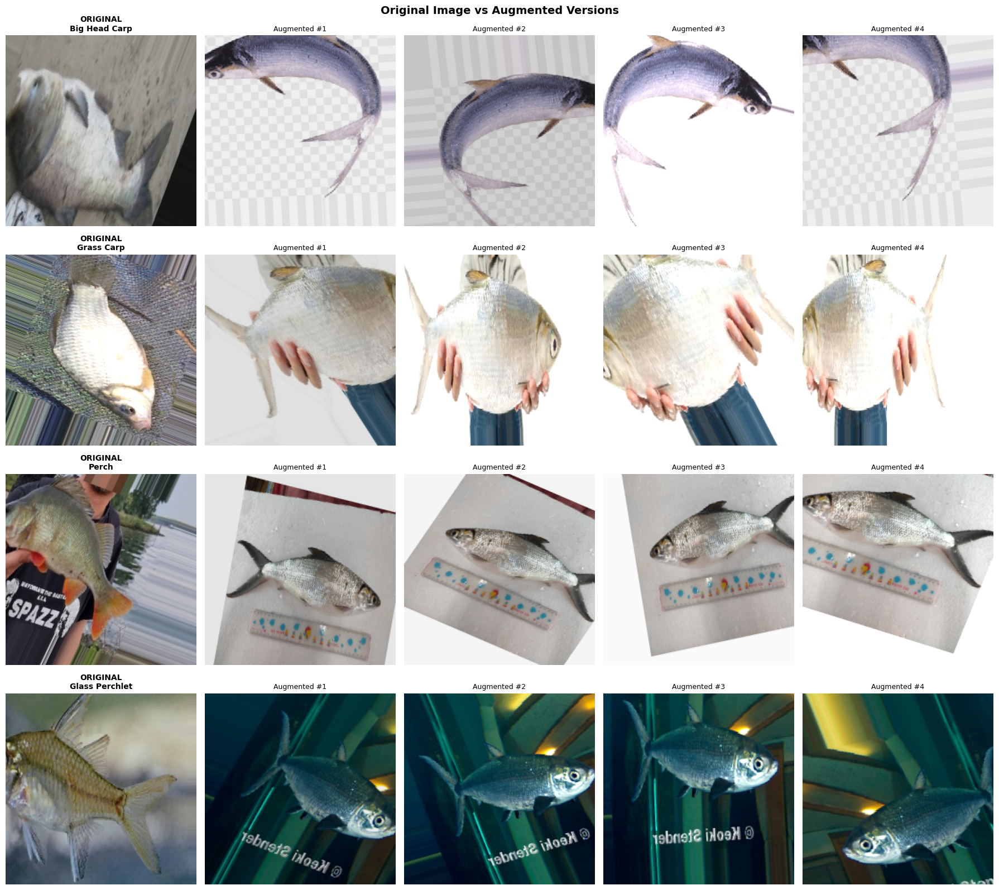


✓ Augmentation visualization complete
  → Verify augmentations look realistic
  → Check if fish still recognizable after transformations


In [29]:
# ============================================================
# VISUALIZE AUGMENTATION EFFECTS
# ============================================================

print("\n" + "="*60)
print("VISUALIZING AUGMENTATION EFFECTS")
print("="*60)

def visualize_augmentation(generator, num_images=4, augmentation_samples=4):
    """
    Visualize original image and its augmented versions
    """
    # Get one batch
    images, labels = next(generator)
    
    # Select random samples
    selected_indices = np.random.choice(len(images), size=num_images, replace=False)
    
    fig, axes = plt.subplots(num_images, augmentation_samples + 1, 
                             figsize=(18, 4*num_images))
    
    for i, img_idx in enumerate(selected_indices):
        # Original image
        original_img = images[img_idx]
        label_idx = np.argmax(labels[img_idx])
        class_name = idx_to_class[label_idx]
        
        # Plot original
        ax = axes[i, 0] if num_images > 1 else axes[0]
        ax.imshow(original_img)
        ax.set_title(f'ORIGINAL\n{class_name}', fontweight='bold', fontsize=10)
        ax.axis('off')
        
        # Generate and plot augmented versions
        img_path = generator.filepaths[img_idx]
        img_array = load_img(img_path, target_size=IMG_SIZE)
        img_array = img_to_array(img_array)
        img_array = np.expand_dims(img_array, axis=0)
        
        # Generate augmented samples
        aug_iter = train_datagen.flow(img_array, batch_size=1, seed=None)
        
        for j in range(augmentation_samples):
            aug_img = next(aug_iter)[0]
            ax = axes[i, j+1] if num_images > 1 else axes[j+1]
            ax.imshow(aug_img)
            ax.set_title(f'Augmented #{j+1}', fontsize=9)
            ax.axis('off')
    
    plt.tight_layout()
    plt.suptitle('Original Image vs Augmented Versions', 
                 fontsize=14, fontweight='bold', y=1.002)
    plt.show()

# Visualize augmentation effects
visualize_augmentation(train_generator, num_images=4, augmentation_samples=4)

print("\n✓ Augmentation visualization complete")
print("  → Verify augmentations look realistic")
print("  → Check if fish still recognizable after transformations")


INSPECTING SAMPLE BATCHES

Batch shapes:
  Images shape: (32, 224, 224, 3)
  Labels shape: (32, 31)

Image statistics (after rescaling):
  Min pixel value: 0.0000
  Max pixel value: 1.0000
  Mean pixel value: 0.4757
  Std pixel value: 0.2949

Label statistics:
  Number of classes in batch: 19
  Label format: One-hot encoded


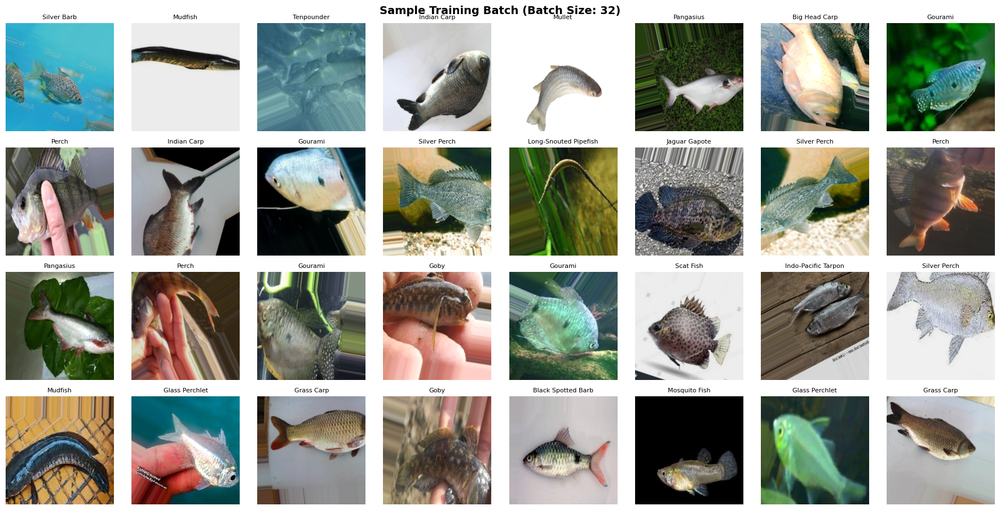


✓ Batch inspection complete
  → Images properly normalized [0, 1]
  → Labels properly one-hot encoded
  → Augmentation working correctly


In [30]:
# ============================================================
# INSPECT SAMPLE BATCHES
# ============================================================

print("\n" + "="*60)
print("INSPECTING SAMPLE BATCHES")
print("="*60)

# Get one batch from training generator
sample_images, sample_labels = next(train_generator)

print(f"\nBatch shapes:")
print(f"  Images shape: {sample_images.shape}")
print(f"  Labels shape: {sample_labels.shape}")

print(f"\nImage statistics (after rescaling):")
print(f"  Min pixel value: {sample_images.min():.4f}")
print(f"  Max pixel value: {sample_images.max():.4f}")
print(f"  Mean pixel value: {sample_images.mean():.4f}")
print(f"  Std pixel value: {sample_images.std():.4f}")

print(f"\nLabel statistics:")
print(f"  Number of classes in batch: {len(np.unique(np.argmax(sample_labels, axis=1)))}")
print(f"  Label format: One-hot encoded")

# Visualize one batch
fig, axes = plt.subplots(4, 8, figsize=(18, 9))
axes = axes.ravel()

for i in range(min(32, BATCH_SIZE)):
    axes[i].imshow(sample_images[i])
    label_idx = np.argmax(sample_labels[i])
    class_name = idx_to_class[label_idx]
    axes[i].set_title(class_name, fontsize=8)
    axes[i].axis('off')

plt.tight_layout()
plt.suptitle(f'Sample Training Batch (Batch Size: {BATCH_SIZE})', 
             fontsize=14, fontweight='bold', y=1.002)
plt.show()

print("\n✓ Batch inspection complete")
print("  → Images properly normalized [0, 1]")
print("  → Labels properly one-hot encoded")
print("  → Augmentation working correctly")

In [31]:
# ============================================================
# TRANSFER LEARNING PREPROCESSING
# ============================================================

print("\n" + "="*60)
print("SETTING UP TRANSFER LEARNING PREPROCESSING")
print("="*60)

from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess

# Create preprocessing function for transfer learning
def preprocess_for_transfer(image):
    """
    Preprocess image for transfer learning
    Apply ImageNet normalization
    """
    return efficientnet_preprocess(image)

# Training generator for Transfer Learning
train_datagen_transfer = ImageDataGenerator(
    preprocessing_function=preprocess_for_transfer,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

# Validation/Test generator for Transfer Learning
val_test_datagen_transfer = ImageDataGenerator(
    preprocessing_function=preprocess_for_transfer
)

# Create generators
train_generator_transfer = train_datagen_transfer.flow_from_directory(
    TRAIN_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=SEED
)

val_generator_transfer = val_test_datagen_transfer.flow_from_directory(
    VAL_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=SEED
)

test_generator_transfer = val_test_datagen_transfer.flow_from_directory(
    TEST_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=SEED
)

print("\n✓ Transfer Learning generators created")
print("  - Preprocessing: ImageNet normalization")
print("  - Mean: [0.485, 0.456, 0.406]")
print("  - Std: [0.229, 0.224, 0.225]")

# Verify preprocessing difference
sample_scratch, _ = next(train_generator)
sample_transfer, _ = next(train_generator_transfer)

print(f"\nPreprocessing verification:")
print(f"  CNN Scratch - Range: [{sample_scratch.min():.2f}, {sample_scratch.max():.2f}]")
print(f"  Transfer Learning - Range: [{sample_transfer.min():.2f}, {sample_transfer.max():.2f}]")

print("\n✓ Dual preprocessing pipelines ready!")


SETTING UP TRANSFER LEARNING PREPROCESSING
Found 8801 images belonging to 31 classes.
Found 2751 images belonging to 31 classes.
Found 1760 images belonging to 31 classes.

✓ Transfer Learning generators created
  - Preprocessing: ImageNet normalization
  - Mean: [0.485, 0.456, 0.406]
  - Std: [0.229, 0.224, 0.225]

Preprocessing verification:
  CNN Scratch - Range: [0.00, 1.00]
  Transfer Learning - Range: [0.00, 255.00]

✓ Dual preprocessing pipelines ready!


In [32]:
# ============================================================
# DATA PIPELINE SUMMARY
# ============================================================

print("\n" + "="*60)
print("DATA PIPELINE SUMMARY")
print("="*60)

summary = {
    "Dataset Split": {
        "Training samples": train_generator.samples,
        "Validation samples": val_generator.samples,
        "Test samples": test_generator.samples,
        "Total samples": train_generator.samples + val_generator.samples + test_generator.samples
    },
    "Data Configuration": {
        "Image size": f"{IMG_WIDTH}x{IMG_HEIGHT}",
        "Batch size": BATCH_SIZE,
        "Number of classes": NUM_CLASSES,
        "Color channels": IMG_CHANNELS
    },
    "Augmentation": {
        "Training": "Heavy (rotation, shift, zoom, brightness, flip)",
        "Validation/Test": "Only rescaling"
    },
    "Class Imbalance": {
        "Method": "Class weights (balanced)",
        "Weight ratio": f"{max(weights_values)/min(weights_values):.2f}:1",
        "Status": "✓ Applied"
    },
    "Generators Available": {
        "CNN Scratch": "train_generator, val_generator, test_generator",
        "Transfer Learning": "train_generator_transfer, val_generator_transfer, test_generator_transfer"
    }
}

for section, details in summary.items():
    print(f"\n{section}:")
    for key, value in details.items():
        print(f"  {key}: {value}")

print("\n" + "="*60)
print("✓ DATA PREPROCESSING PIPELINE COMPLETE!")
print("="*60)
print("\nReady for model training! 🚀")


DATA PIPELINE SUMMARY

Dataset Split:
  Training samples: 8801
  Validation samples: 2751
  Test samples: 1760
  Total samples: 13312

Data Configuration:
  Image size: 224x224
  Batch size: 32
  Number of classes: 31
  Color channels: 3

Augmentation:
  Training: Heavy (rotation, shift, zoom, brightness, flip)
  Validation/Test: Only rescaling

Class Imbalance:
  Method: Class weights (balanced)
  Weight ratio: 11.11:1
  Status: ✓ Applied

Generators Available:
  CNN Scratch: train_generator, val_generator, test_generator
  Transfer Learning: train_generator_transfer, val_generator_transfer, test_generator_transfer

✓ DATA PREPROCESSING PIPELINE COMPLETE!

Ready for model training! 🚀


In [33]:
# ============================================================
# TRANSFER LEARNING PREPROCESSING
# ============================================================

print("\n" + "="*60)
print("SETTING UP TRANSFER LEARNING PREPROCESSING")
print("="*60)

from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess

# STRATEGY 1: For CNN from Scratch (current generators are OK)
print("\n✓ Strategy 1 (CNN from Scratch): Using existing generators")
print("  - Rescale: [0, 1]")
print("  - Augmentation: Heavy")

# STRATEGY 2: For Transfer Learning (NEW)
# Create preprocessing function for transfer learning
def preprocess_for_transfer(image):
    """
    Preprocess image for transfer learning
    Apply ImageNet normalization
    """
    return efficientnet_preprocess(image)

# Training generator for Transfer Learning
train_datagen_transfer = ImageDataGenerator(
    preprocessing_function=preprocess_for_transfer,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

# Validation/Test generator for Transfer Learning
val_test_datagen_transfer = ImageDataGenerator(
    preprocessing_function=preprocess_for_transfer
)

# Create generators (GANTI TRAIN_DIR → TRAIN_PATH)
train_generator_transfer = train_datagen_transfer.flow_from_directory(
    TRAIN_PATH,  # ← FIXED: Pakai TRAIN_PATH bukan TRAIN_DIR
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=SEED
)

val_generator_transfer = val_test_datagen_transfer.flow_from_directory(
    VAL_PATH,  # ← FIXED: Pakai VAL_PATH bukan VAL_DIR
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=SEED
)

test_generator_transfer = val_test_datagen_transfer.flow_from_directory(
    TEST_PATH,  # ← FIXED: Pakai TEST_PATH bukan TEST_DIR
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=SEED
)

print("\n✓ Strategy 2 (Transfer Learning): New generators created")
print("  - Preprocessing: ImageNet normalization")
print("  - Mean: [0.485, 0.456, 0.406]")
print("  - Std: [0.229, 0.224, 0.225]")
print("  - Augmentation: Heavy (same as scratch)")

# Verify preprocessing difference
print("\n" + "="*60)
print("VERIFYING PREPROCESSING DIFFERENCE")
print("="*60)

# Get sample from both generators
sample_scratch, _ = next(train_generator)
sample_transfer, _ = next(train_generator_transfer)

print(f"\nCNN from Scratch preprocessing:")
print(f"  Min: {sample_scratch.min():.4f}")
print(f"  Max: {sample_scratch.max():.4f}")
print(f"  Mean: {sample_scratch.mean():.4f}")
print(f"  Std: {sample_scratch.std():.4f}")

print(f"\nTransfer Learning preprocessing:")
print(f"  Min: {sample_transfer.min():.4f}")
print(f"  Max: {sample_transfer.max():.4f}")
print(f"  Mean: {sample_transfer.mean():.4f}")
print(f"  Std: {sample_transfer.std():.4f}")

print("\n✓ Preprocessing pipelines verified!")
print("  → CNN Scratch: [0, 1] normalization")
print("  → Transfer Learning: ImageNet normalization")


SETTING UP TRANSFER LEARNING PREPROCESSING

✓ Strategy 1 (CNN from Scratch): Using existing generators
  - Rescale: [0, 1]
  - Augmentation: Heavy
Found 8801 images belonging to 31 classes.
Found 2751 images belonging to 31 classes.
Found 1760 images belonging to 31 classes.

✓ Strategy 2 (Transfer Learning): New generators created
  - Preprocessing: ImageNet normalization
  - Mean: [0.485, 0.456, 0.406]
  - Std: [0.229, 0.224, 0.225]
  - Augmentation: Heavy (same as scratch)

VERIFYING PREPROCESSING DIFFERENCE

CNN from Scratch preprocessing:
  Min: 0.0000
  Max: 1.0000
  Mean: 0.4509
  Std: 0.2958

Transfer Learning preprocessing:
  Min: 0.0000
  Max: 255.0000
  Mean: 124.4538
  Std: 62.4693

✓ Preprocessing pipelines verified!
  → CNN Scratch: [0, 1] normalization
  → Transfer Learning: ImageNet normalization


In [34]:
# ============================================================
# GENERATOR MAPPING REFERENCE
# ============================================================

print("\n" + "="*60)
print("GENERATOR USAGE GUIDE")
print("="*60)

generator_mapping = {
    "CNN from Scratch": {
        "Training": "train_generator",
        "Validation": "val_generator",
        "Test": "test_generator",
        "Preprocessing": "Simple rescale [0, 1]"
    },
    "Transfer Learning": {
        "Training": "train_generator_transfer",
        "Validation": "val_generator_transfer",
        "Test": "test_generator_transfer",
        "Preprocessing": "ImageNet normalization"
    }
}

for model_type, generators in generator_mapping.items():
    print(f"\n{model_type}:")
    for stage, gen_name in generators.items():
        print(f"  {stage:15s}: {gen_name}")

print("\n✓ Generator mapping saved")
print("\nIMPORTANT:")
print("  - Use 'train_generator' for CNN from scratch")
print("  - Use 'train_generator_transfer' for EfficientNet/ResNet")
print("  - DO NOT mix them up!")



GENERATOR USAGE GUIDE

CNN from Scratch:
  Training       : train_generator
  Validation     : val_generator
  Test           : test_generator
  Preprocessing  : Simple rescale [0, 1]

Transfer Learning:
  Training       : train_generator_transfer
  Validation     : val_generator_transfer
  Test           : test_generator_transfer
  Preprocessing  : ImageNet normalization

✓ Generator mapping saved

IMPORTANT:
  - Use 'train_generator' for CNN from scratch
  - Use 'train_generator_transfer' for EfficientNet/ResNet
  - DO NOT mix them up!


In [35]:
# ============================================================
# CNN FROM SCRATCH ARCHITECTURE
# ============================================================

print("\n" + "="*60)
print("BUILDING CNN FROM SCRATCH")
print("="*60)

def build_cnn_scratch(input_shape=(224, 224, 3), num_classes=31):
    """
    Build CNN architecture from scratch

    Architecture Philosophy:
    - Progressive feature extraction: 32 → 64 → 128 → 256
    - BatchNormalization for stable training
    - MaxPooling for spatial dimension reduction
    - Dropout for regularization
    - GlobalAveragePooling to reduce parameters
    """

    model = models.Sequential(name='CNN_Scratch_FishClassifier')

    # ============================================================
    # BLOCK 1: Low-level feature extraction
    # ============================================================
    model.add(layers.Conv2D(32, (3, 3), padding='same',
                           input_shape=input_shape, name='conv1_1'))
    model.add(layers.BatchNormalization(name='bn1_1'))
    model.add(layers.Activation('relu', name='relu1_1'))

    model.add(layers.Conv2D(32, (3, 3), padding='same', name='conv1_2'))
    model.add(layers.BatchNormalization(name='bn1_2'))
    model.add(layers.Activation('relu', name='relu1_2'))
    model.add(layers.MaxPooling2D((2, 2), name='pool1'))
    model.add(layers.Dropout(0.25, name='dropout1'))

    # ============================================================
    # BLOCK 2: Intermediate feature extraction
    # ============================================================
    model.add(layers.Conv2D(64, (3, 3), padding='same', name='conv2_1'))
    model.add(layers.BatchNormalization(name='bn2_1'))
    model.add(layers.Activation('relu', name='relu2_1'))

    model.add(layers.Conv2D(64, (3, 3), padding='same', name='conv2_2'))
    model.add(layers.BatchNormalization(name='bn2_2'))
    model.add(layers.Activation('relu', name='relu2_2'))
    model.add(layers.MaxPooling2D((2, 2), name='pool2'))
    model.add(layers.Dropout(0.25, name='dropout2'))

    # ============================================================
    # BLOCK 3: High-level feature extraction
    # ============================================================
    model.add(layers.Conv2D(128, (3, 3), padding='same', name='conv3_1'))
    model.add(layers.BatchNormalization(name='bn3_1'))
    model.add(layers.Activation('relu', name='relu3_1'))

    model.add(layers.Conv2D(128, (3, 3), padding='same', name='conv3_2'))
    model.add(layers.BatchNormalization(name='bn3_2'))
    model.add(layers.Activation('relu', name='relu3_2'))
    model.add(layers.MaxPooling2D((2, 2), name='pool3'))
    model.add(layers.Dropout(0.3, name='dropout3'))

    # ============================================================
    # BLOCK 4: Abstract pattern extraction
    # ============================================================
    model.add(layers.Conv2D(256, (3, 3), padding='same', name='conv4_1'))
    model.add(layers.BatchNormalization(name='bn4_1'))
    model.add(layers.Activation('relu', name='relu4_1'))

    model.add(layers.Conv2D(256, (3, 3), padding='same', name='conv4_2'))
    model.add(layers.BatchNormalization(name='bn4_2'))
    model.add(layers.Activation('relu', name='relu4_2'))
    model.add(layers.MaxPooling2D((2, 2), name='pool4'))
    model.add(layers.Dropout(0.3, name='dropout4'))

    # ============================================================
    # CLASSIFICATION HEAD
    # ============================================================
    model.add(layers.GlobalAveragePooling2D(name='global_avg_pool'))

    # Dense layers with regularization
    model.add(layers.Dense(512, name='fc1'))
    model.add(layers.BatchNormalization(name='bn_fc1'))
    model.add(layers.Activation('relu', name='relu_fc1'))
    model.add(layers.Dropout(0.5, name='dropout_fc1'))

    model.add(layers.Dense(256, name='fc2'))
    model.add(layers.BatchNormalization(name='bn_fc2'))
    model.add(layers.Activation('relu', name='relu_fc2'))
    model.add(layers.Dropout(0.4, name='dropout_fc2'))

    # Output layer
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))

    return model

# Build model
print("\nBuilding CNN architecture...")
model_scratch = build_cnn_scratch(input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS),
                                   num_classes=NUM_CLASSES)

print("✓ Model built successfully!\n")

# Display architecture
model_scratch.summary()

# Count parameters
total_params = model_scratch.count_params()
trainable_params = sum([tf.size(w).numpy() for w in model_scratch.trainable_weights])

print(f"\n{'='*60}")
print(f"MODEL STATISTICS")
print(f"{'='*60}")
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Model depth: {len(model_scratch.layers)} layers")
print(f"Convolutional blocks: 4")
print(f"Dense layers: 2")


BUILDING CNN FROM SCRATCH

Building CNN architecture...
✓ Model built successfully!

Model: "CNN_Scratch_FishClassifier"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1_1 (Conv2D)            (None, 224, 224, 32)      896       
                                                                 
 bn1_1 (BatchNormalization)  (None, 224, 224, 32)      128       
                                                                 
 relu1_1 (Activation)        (None, 224, 224, 32)      0         
                                                                 
 conv1_2 (Conv2D)            (None, 224, 224, 32)      9248      
                                                                 
 bn1_2 (BatchNormalization)  (None, 224, 224, 32)      128       
                                                                 
 relu1_2 (Activation)        (None, 224, 224, 32)      0         
                    

In [36]:
# ============================================================
# COMPILE MODEL
# ============================================================

print("\n" + "="*60)
print("COMPILING MODEL")
print("="*60)

# Optimizer with learning rate
initial_learning_rate = 0.001
optimizer = keras.optimizers.Adam(learning_rate=initial_learning_rate)

# Compile model
model_scratch.compile(
    optimizer=optimizer,
    loss='categorical_crossentropy',  # Multi-class classification
    metrics=[
        'accuracy',
        keras.metrics.TopKCategoricalAccuracy(k=3, name='top3_accuracy'),
        keras.metrics.Precision(name='precision'),
        keras.metrics.Recall(name='recall')
    ]
)

print(f"\n✓ Model compiled successfully!")
print(f"\nCompilation details:")
print(f"  Optimizer: Adam")
print(f"  Learning rate: {initial_learning_rate}")
print(f"  Loss function: Categorical Crossentropy")
print(f"  Metrics: Accuracy, Top-3 Accuracy, Precision, Recall")
print(f"  Class weights: Applied during training")


COMPILING MODEL

✓ Model compiled successfully!

Compilation details:
  Optimizer: Adam
  Learning rate: 0.001
  Loss function: Categorical Crossentropy
  Metrics: Accuracy, Top-3 Accuracy, Precision, Recall
  Class weights: Applied during training


In [37]:
# ============================================================
# SETUP TRAINING CALLBACKS
# ============================================================

print("\n" + "="*60)
print("CONFIGURING CALLBACKS")
print("="*60)

# Model save directory sudah dibuat di Cell 6, jadi pakai yang itu
# MODEL_SAVE_DIR = os.path.join(BASE_PATH, 'models')  # ← Sudah ada dari Cell 6

# 1. ModelCheckpoint - Save best model
checkpoint_path = os.path.join(MODEL_SAVE_DIR, 'cnn_scratch_best.keras')
checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

# 2. EarlyStopping - Stop if no improvement
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

# 3. ReduceLROnPlateau - Dynamic learning rate
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,          # Reduce LR by half
    patience=5,
    min_lr=1e-7,
    verbose=1
)

# 4. CSV Logger - Save training history
csv_logger_path = os.path.join(MODEL_SAVE_DIR, 'cnn_scratch_training_log.csv')
csv_logger = keras.callbacks.CSVLogger(csv_logger_path)

# Combine all callbacks
callbacks_list = [
    checkpoint_callback,
    early_stopping,
    reduce_lr,
    csv_logger
]

print("\n✓ Callbacks configured:")
print(f"  1. ModelCheckpoint → Save best model to: {checkpoint_path}")
print(f"  2. EarlyStopping → Patience: 10 epochs")
print(f"  3. ReduceLROnPlateau → Factor: 0.5, Patience: 5")
print(f"  4. CSVLogger → Save history to: {csv_logger_path}")


CONFIGURING CALLBACKS

✓ Callbacks configured:
  1. ModelCheckpoint → Save best model to: C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\models\cnn_scratch_best.keras
  2. EarlyStopping → Patience: 10 epochs
  3. ReduceLROnPlateau → Factor: 0.5, Patience: 5
  4. CSVLogger → Save history to: C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\models\cnn_scratch_training_log.csv


In [38]:
# ============================================================
# TRAIN CNN FROM SCRATCH
# ============================================================

print("\n" + "="*60)
print("STARTING TRAINING - CNN FROM SCRATCH")
print("="*60)

print(f"\nTraining configuration:")
print(f"  Training samples: {train_generator.samples}")
print(f"  Validation samples: {val_generator.samples}")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Steps per epoch: {len(train_generator)}")
print(f"  Validation steps: {len(val_generator)}")
print(f"  Max epochs: {EPOCHS_SCRATCH}")
print(f"  Class weights: Applied")

print(f"\n{'='*60}")
print("Training in progress... (This may take 30-60 minutes)")
print(f"{'='*60}\n")

# Start training
history_scratch = model_scratch.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=EPOCHS_SCRATCH,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    class_weight=class_weights_dict,  # Apply class weights for imbalance
    callbacks=callbacks_list,
    verbose=1
)

print(f"\n{'='*60}")
print("✓ TRAINING COMPLETE!")
print(f"{'='*60}")

# Get final metrics
final_train_acc = history_scratch.history['accuracy'][-1]
final_val_acc = history_scratch.history['val_accuracy'][-1]
final_train_loss = history_scratch.history['loss'][-1]
final_val_loss = history_scratch.history['val_loss'][-1]

print(f"\nFinal Training Metrics:")
print(f"  Training Accuracy: {final_train_acc:.4f}")
print(f"  Training Loss: {final_train_loss:.4f}")
print(f"\nFinal Validation Metrics:")
print(f"  Validation Accuracy: {final_val_acc:.4f}")
print(f"  Validation Loss: {final_val_loss:.4f}")

# Find best epoch
best_epoch = np.argmax(history_scratch.history['val_accuracy']) + 1
best_val_acc = max(history_scratch.history['val_accuracy'])

print(f"\nBest Model:")
print(f"  Best epoch: {best_epoch}")
print(f"  Best validation accuracy: {best_val_acc:.4f}")


STARTING TRAINING - CNN FROM SCRATCH

Training configuration:
  Training samples: 8801
  Validation samples: 2751
  Batch size: 32
  Steps per epoch: 276
  Validation steps: 86
  Max epochs: 50
  Class weights: Applied

Training in progress... (This may take 30-60 minutes)

Epoch 1/50
276/276 [==============================] - ETA: 0s - loss: 3.6033 - accuracy: 0.0627 - top3_accuracy: 0.1593 - precision: 0.0906 - recall: 0.0030
Epoch 1: val_accuracy improved from -inf to 0.04653, saving model to C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\models\cnn_scratch_best.keras
276/276 [==============================] - 612s 2s/step - loss: 3.6033 - accuracy: 0.0627 - top3_accuracy: 0.1593 - precision: 0.0906 - recall: 0.0030 - val_loss: 3.5165 - val_accuracy: 0.0465 - val_top3_accuracy: 0.1581 - val_precision: 0.3308 - val_recall: 0.0160 - lr: 0.0010
Epoch 2/50
276/276 [==============================] - ETA: 0s - loss: 3.2516 - accuracy: 0.1001 - top3_accuracy:


VISUALIZING TRAINING HISTORY


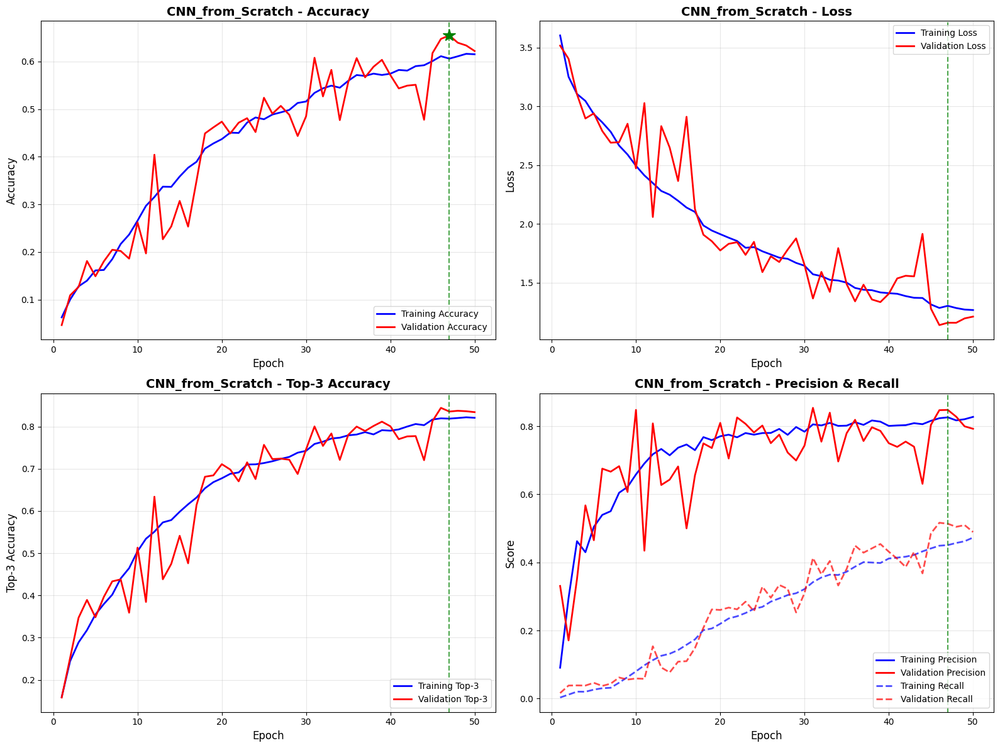


✓ Training history visualized and saved


In [39]:
# ============================================================
# VISUALIZE TRAINING HISTORY
# ============================================================

print("\n" + "="*60)
print("VISUALIZING TRAINING HISTORY")
print("="*60)

def plot_training_history(history, model_name='CNN from Scratch'):
    """
    Plot training and validation metrics
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # Get metrics
    epochs_range = range(1, len(history.history['accuracy']) + 1)
    
    # 1. Accuracy
    ax1 = axes[0, 0]
    ax1.plot(epochs_range, history.history['accuracy'], 'b-', label='Training Accuracy', linewidth=2)
    ax1.plot(epochs_range, history.history['val_accuracy'], 'r-', label='Validation Accuracy', linewidth=2)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.set_title(f'{model_name} - Accuracy', fontsize=14, fontweight='bold')
    ax1.legend(loc='lower right')
    ax1.grid(True, alpha=0.3)
    
    # Mark best epoch
    best_epoch = np.argmax(history.history['val_accuracy']) + 1
    best_val_acc = max(history.history['val_accuracy'])
    ax1.axvline(x=best_epoch, color='g', linestyle='--', alpha=0.7, label=f'Best Epoch: {best_epoch}')
    ax1.plot(best_epoch, best_val_acc, 'g*', markersize=15)
    
    # 2. Loss
    ax2 = axes[0, 1]
    ax2.plot(epochs_range, history.history['loss'], 'b-', label='Training Loss', linewidth=2)
    ax2.plot(epochs_range, history.history['val_loss'], 'r-', label='Validation Loss', linewidth=2)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.set_title(f'{model_name} - Loss', fontsize=14, fontweight='bold')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3)
    ax2.axvline(x=best_epoch, color='g', linestyle='--', alpha=0.7)
    
    # 3. Top-3 Accuracy
    ax3 = axes[1, 0]
    ax3.plot(epochs_range, history.history['top3_accuracy'], 'b-', label='Training Top-3', linewidth=2)
    ax3.plot(epochs_range, history.history['val_top3_accuracy'], 'r-', label='Validation Top-3', linewidth=2)
    ax3.set_xlabel('Epoch', fontsize=12)
    ax3.set_ylabel('Top-3 Accuracy', fontsize=12)
    ax3.set_title(f'{model_name} - Top-3 Accuracy', fontsize=14, fontweight='bold')
    ax3.legend(loc='lower right')
    ax3.grid(True, alpha=0.3)
    ax3.axvline(x=best_epoch, color='g', linestyle='--', alpha=0.7)
    
    # 4. Precision & Recall
    ax4 = axes[1, 1]
    ax4.plot(epochs_range, history.history['precision'], 'b-', label='Training Precision', linewidth=2)
    ax4.plot(epochs_range, history.history['val_precision'], 'r-', label='Validation Precision', linewidth=2)
    ax4.plot(epochs_range, history.history['recall'], 'b--', label='Training Recall', linewidth=2, alpha=0.7)
    ax4.plot(epochs_range, history.history['val_recall'], 'r--', label='Validation Recall', linewidth=2, alpha=0.7)
    ax4.set_xlabel('Epoch', fontsize=12)
    ax4.set_ylabel('Score', fontsize=12)
    ax4.set_title(f'{model_name} - Precision & Recall', fontsize=14, fontweight='bold')
    ax4.legend(loc='lower right')
    ax4.grid(True, alpha=0.3)
    ax4.axvline(x=best_epoch, color='g', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.savefig(os.path.join(MODEL_SAVE_DIR, f'{model_name.replace(" ", "_")}_training_history.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\n✓ Training history visualized and saved")

# Plot training history
plot_training_history(history_scratch, 'CNN_from_Scratch')

In [40]:
# ============================================================
# EVALUATE ON TEST SET
# ============================================================

print("\n" + "="*60)
print("EVALUATING CNN FROM SCRATCH ON TEST SET")
print("="*60)

# Evaluate model
print("\nEvaluating model on test set...")
test_results = model_scratch.evaluate(
    test_generator,
    steps=len(test_generator),
    verbose=1
)

# Display results
print(f"\n{'='*60}")
print("TEST SET RESULTS")
print(f"{'='*60}")
print(f"Test Loss: {test_results[0]:.4f}")
print(f"Test Accuracy: {test_results[1]:.4f}")
print(f"Test Top-3 Accuracy: {test_results[2]:.4f}")
print(f"Test Precision: {test_results[3]:.4f}")
print(f"Test Recall: {test_results[4]:.4f}")

# Calculate F1-Score
test_f1 = 2 * (test_results[3] * test_results[4]) / (test_results[3] + test_results[4])
print(f"Test F1-Score: {test_f1:.4f}")


EVALUATING CNN FROM SCRATCH ON TEST SET

Evaluating model on test set...
55/55 [==============================] - 31s 566ms/step - loss: 1.1740 - accuracy: 0.6403 - top3_accuracy: 0.8426 - precision: 0.8234 - recall: 0.5114

TEST SET RESULTS
Test Loss: 1.1740
Test Accuracy: 0.6403
Test Top-3 Accuracy: 0.8426
Test Precision: 0.8234
Test Recall: 0.5114
Test F1-Score: 0.6309



GENERATING PREDICTIONS ON TEST SET

Generating predictions...
55/55 [==============================] - 25s 457ms/step

✓ Predictions generated
  Total test samples: 1760
  Predictions shape: (1760,)

CREATING CONFUSION MATRIX


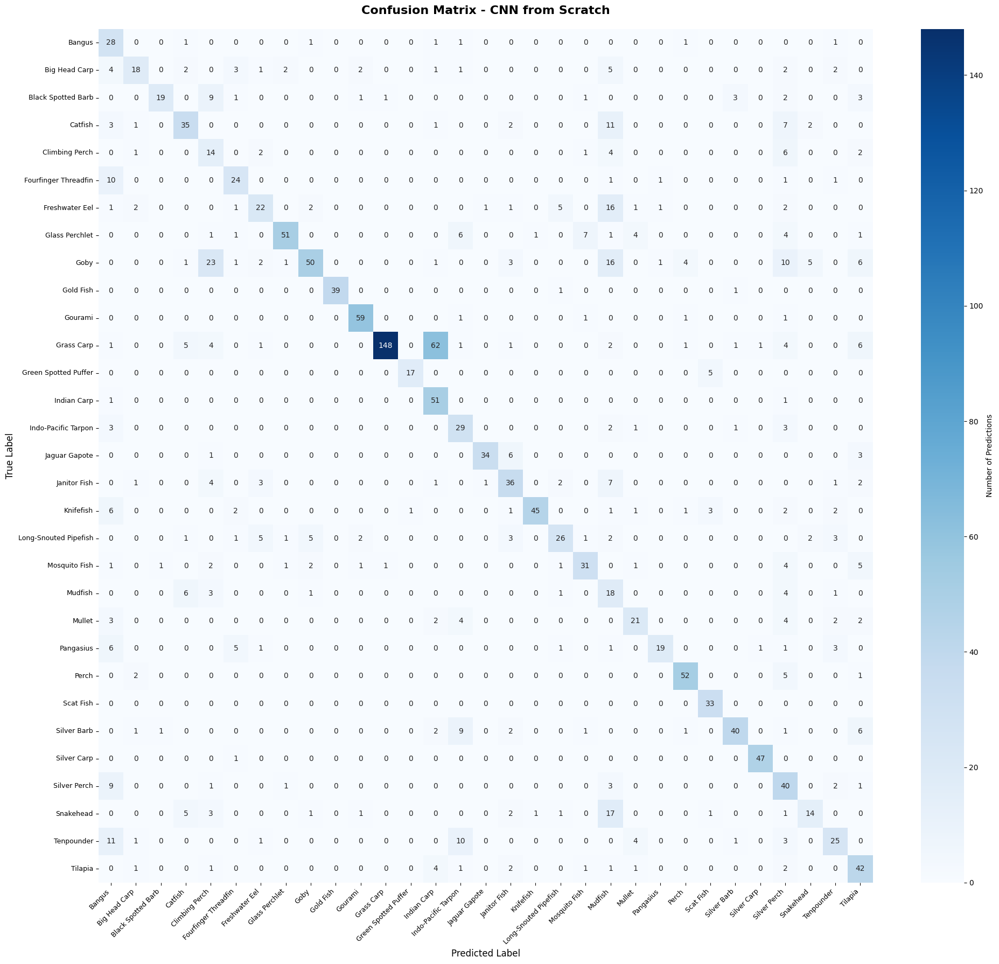


✓ Confusion matrix created and saved


In [41]:
# ============================================================
# GENERATE PREDICTIONS
# ============================================================

print("\n" + "="*60)
print("GENERATING PREDICTIONS ON TEST SET")
print("="*60)

# Reset test generator
test_generator.reset()

# Get predictions
print("\nGenerating predictions...")
y_pred_probs = model_scratch.predict(test_generator, steps=len(test_generator), verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.classes

print(f"\n✓ Predictions generated")
print(f"  Total test samples: {len(y_true)}")
print(f"  Predictions shape: {y_pred.shape}")

# ============================================================
# CONFUSION MATRIX
# ============================================================

print("\n" + "="*60)
print("CREATING CONFUSION MATRIX")
print("="*60)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(20, 18))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names,
            cbar_kws={'label': 'Number of Predictions'})
plt.title('Confusion Matrix - CNN from Scratch', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(rotation=0, fontsize=9)
plt.tight_layout()
plt.savefig(os.path.join(MODEL_SAVE_DIR, 'CNN_Scratch_confusion_matrix.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Confusion matrix created and saved")


PER-CLASS PERFORMANCE ANALYSIS

TOP 5 BEST PERFORMING CLASSES (by F1-score):
             precision    recall  f1-score  support
Gold Fish     1.000000  0.951220  0.975000     41.0
Silver Carp   0.959184  0.979167  0.969072     48.0
Gourami       0.893939  0.936508  0.914729     63.0
Scat Fish     0.785714  1.000000  0.880000     33.0
Perch         0.852459  0.866667  0.859504     60.0

BOTTOM 5 WORST PERFORMING CLASSES (by F1-score):
                precision    recall  f1-score  support
Mudfish          0.166667  0.529412  0.253521     34.0
Climbing Perch   0.212121  0.466667  0.291667     30.0
Snakehead        0.608696  0.297872  0.400000     47.0
Bangus           0.321839  0.823529  0.462810     34.0
Freshwater Eel   0.578947  0.400000  0.473118     55.0

✓ Classification report saved


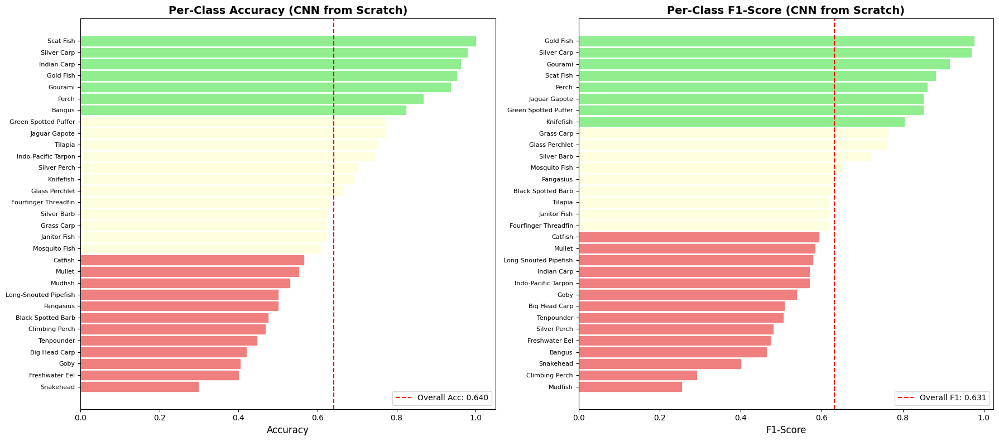


✓ Per-class performance visualized


In [42]:
# ============================================================
# PER-CLASS PERFORMANCE ANALYSIS
# ============================================================

print("\n" + "="*60)
print("PER-CLASS PERFORMANCE ANALYSIS")
print("="*60)

# Generate classification report
from sklearn.metrics import classification_report

report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)

# Convert to DataFrame for better visualization
report_df = pd.DataFrame(report).transpose()

# Display top and bottom performers
print("\nTOP 5 BEST PERFORMING CLASSES (by F1-score):")
top_classes = report_df.iloc[:-3].sort_values('f1-score', ascending=False).head(5)
print(top_classes[['precision', 'recall', 'f1-score', 'support']])

print("\nBOTTOM 5 WORST PERFORMING CLASSES (by F1-score):")
bottom_classes = report_df.iloc[:-3].sort_values('f1-score', ascending=True).head(5)
print(bottom_classes[['precision', 'recall', 'f1-score', 'support']])

# Save full report
report_df.to_csv(os.path.join(MODEL_SAVE_DIR, 'CNN_Scratch_classification_report.csv'))
print("\n✓ Classification report saved")

# ============================================================
# VISUALIZE PER-CLASS PERFORMANCE
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Per-class accuracy
per_class_accuracy = []
for i, class_name in enumerate(class_names):
    class_indices = np.where(y_true == i)[0]
    if len(class_indices) > 0:
        class_acc = np.mean(y_pred[class_indices] == y_true[class_indices])
        per_class_accuracy.append((class_name, class_acc, len(class_indices)))

per_class_df = pd.DataFrame(per_class_accuracy, columns=['Class', 'Accuracy', 'Support'])
per_class_df = per_class_df.sort_values('Accuracy', ascending=True)

# Plot 1: Per-class accuracy
ax1 = axes[0]
bars = ax1.barh(range(len(per_class_df)), per_class_df['Accuracy'], color='skyblue', edgecolor='black')
ax1.set_yticks(range(len(per_class_df)))
ax1.set_yticklabels(per_class_df['Class'], fontsize=8)
ax1.set_xlabel('Accuracy', fontsize=12)
ax1.set_title('Per-Class Accuracy (CNN from Scratch)', fontsize=14, fontweight='bold')
ax1.axvline(x=test_results[1], color='r', linestyle='--', label=f'Overall Acc: {test_results[1]:.3f}')
ax1.legend()

# Color bars based on performance
for i, bar in enumerate(bars):
    if per_class_df.iloc[i]['Accuracy'] >= 0.8:
        bar.set_color('lightgreen')
    elif per_class_df.iloc[i]['Accuracy'] >= 0.6:
        bar.set_color('lightyellow')
    else:
        bar.set_color('lightcoral')

# Plot 2: F1-Score distribution
ax2 = axes[1]
f1_scores = report_df.iloc[:-3]['f1-score'].sort_values()
bars2 = ax2.barh(range(len(f1_scores)), f1_scores, color='lightblue', edgecolor='black')
ax2.set_yticks(range(len(f1_scores)))
ax2.set_yticklabels(f1_scores.index, fontsize=8)
ax2.set_xlabel('F1-Score', fontsize=12)
ax2.set_title('Per-Class F1-Score (CNN from Scratch)', fontsize=14, fontweight='bold')
ax2.axvline(x=test_f1, color='r', linestyle='--', label=f'Overall F1: {test_f1:.3f}')
ax2.legend()

for i, bar in enumerate(bars2):
    if f1_scores.iloc[i] >= 0.8:
        bar.set_color('lightgreen')
    elif f1_scores.iloc[i] >= 0.6:
        bar.set_color('lightyellow')
    else:
        bar.set_color('lightcoral')

plt.tight_layout()
plt.savefig(os.path.join(MODEL_SAVE_DIR, 'CNN_Scratch_per_class_performance.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Per-class performance visualized")


ANALYZING MISCLASSIFICATIONS

TOP 10 MOST CONFUSED CLASS PAIRS:
True Class                     → Predicted Class                  Count
Grass Carp                     → Indian Carp                       62
Goby                           → Climbing Perch                    23
Snakehead                      → Mudfish                           17
Freshwater Eel                 → Mudfish                           16
Goby                           → Mudfish                           16
Catfish                        → Mudfish                           11
Tenpounder                     → Bangus                            11
Fourfinger Threadfin           → Bangus                            10
Goby                           → Silver Perch                      10
Tenpounder                     → Indo-Pacific Tarpon               10


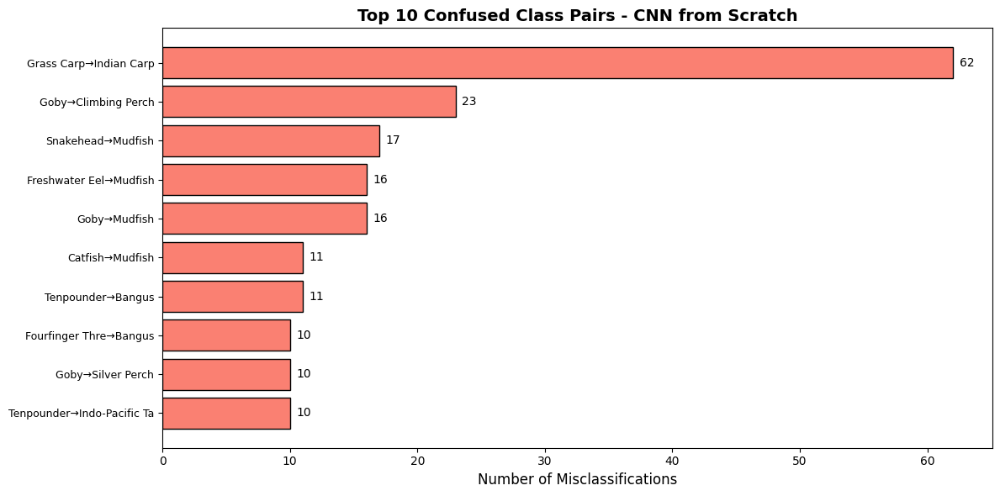


✓ Misclassification analysis complete


In [43]:
# ============================================================
# MISCLASSIFICATION ANALYSIS
# ============================================================

print("\n" + "="*60)
print("ANALYZING MISCLASSIFICATIONS")
print("="*60)

# Find most confused class pairs
misclassified_pairs = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if i != j and cm[i, j] > 0:
            misclassified_pairs.append((class_names[i], class_names[j], cm[i, j]))

# Sort by count
misclassified_pairs.sort(key=lambda x: x[2], reverse=True)

print("\nTOP 10 MOST CONFUSED CLASS PAIRS:")
print(f"{'True Class':30s} → {'Predicted Class':30s}   Count")
print("="*75)
for true_class, pred_class, count in misclassified_pairs[:10]:
    print(f"{true_class:30s} → {pred_class:30s}   {count:3d}")

# Visualize confusion pairs
top_pairs = misclassified_pairs[:10]
pair_labels = [f"{t[:15]}→{p[:15]}" for t, p, _ in top_pairs]
pair_counts = [c for _, _, c in top_pairs]

plt.figure(figsize=(12, 6))
plt.barh(range(len(pair_counts)), pair_counts, color='salmon', edgecolor='black')
plt.yticks(range(len(pair_labels)), pair_labels, fontsize=9)
plt.xlabel('Number of Misclassifications', fontsize=12)
plt.title('Top 10 Confused Class Pairs - CNN from Scratch', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
for i, count in enumerate(pair_counts):
    plt.text(count + 0.5, i, str(count), va='center', fontsize=10)
plt.tight_layout()
plt.savefig(os.path.join(MODEL_SAVE_DIR, 'CNN_Scratch_misclassification_analysis.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Misclassification analysis complete")


VISUALIZING SAMPLE PREDICTIONS

Visualizing CORRECT predictions...


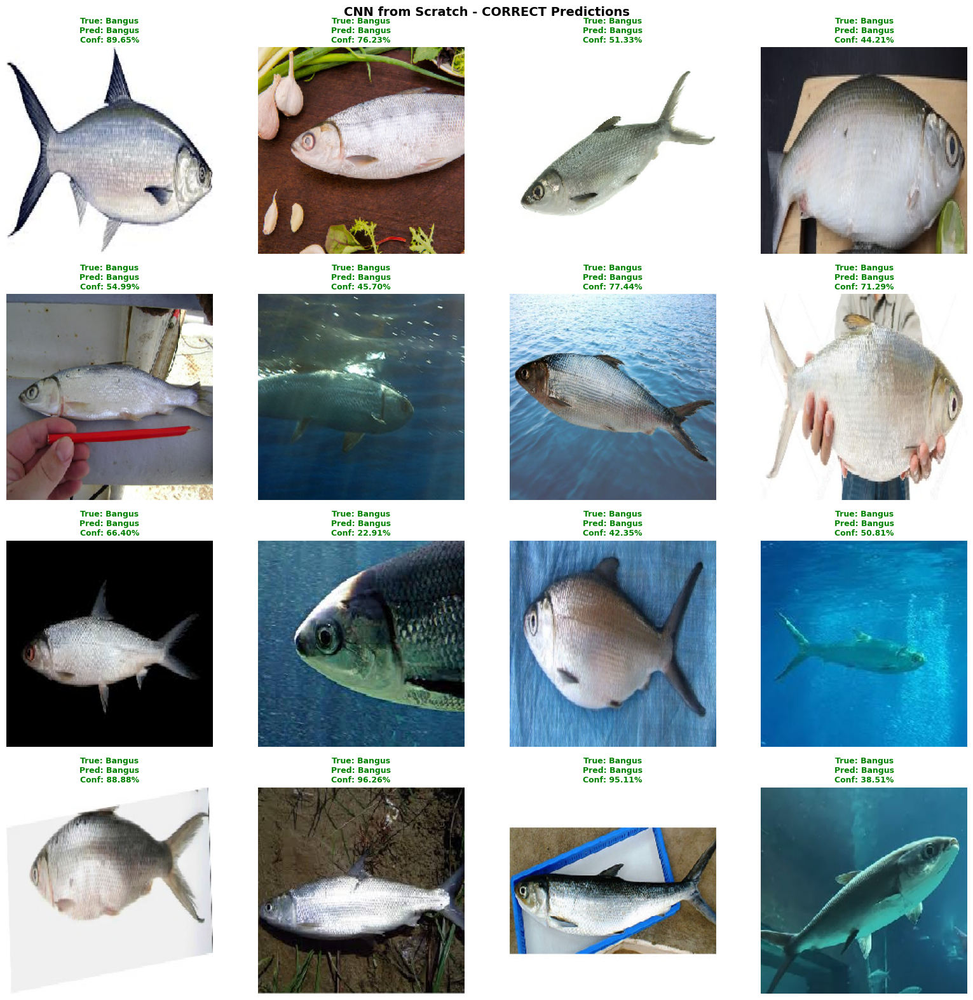


Visualizing INCORRECT predictions...


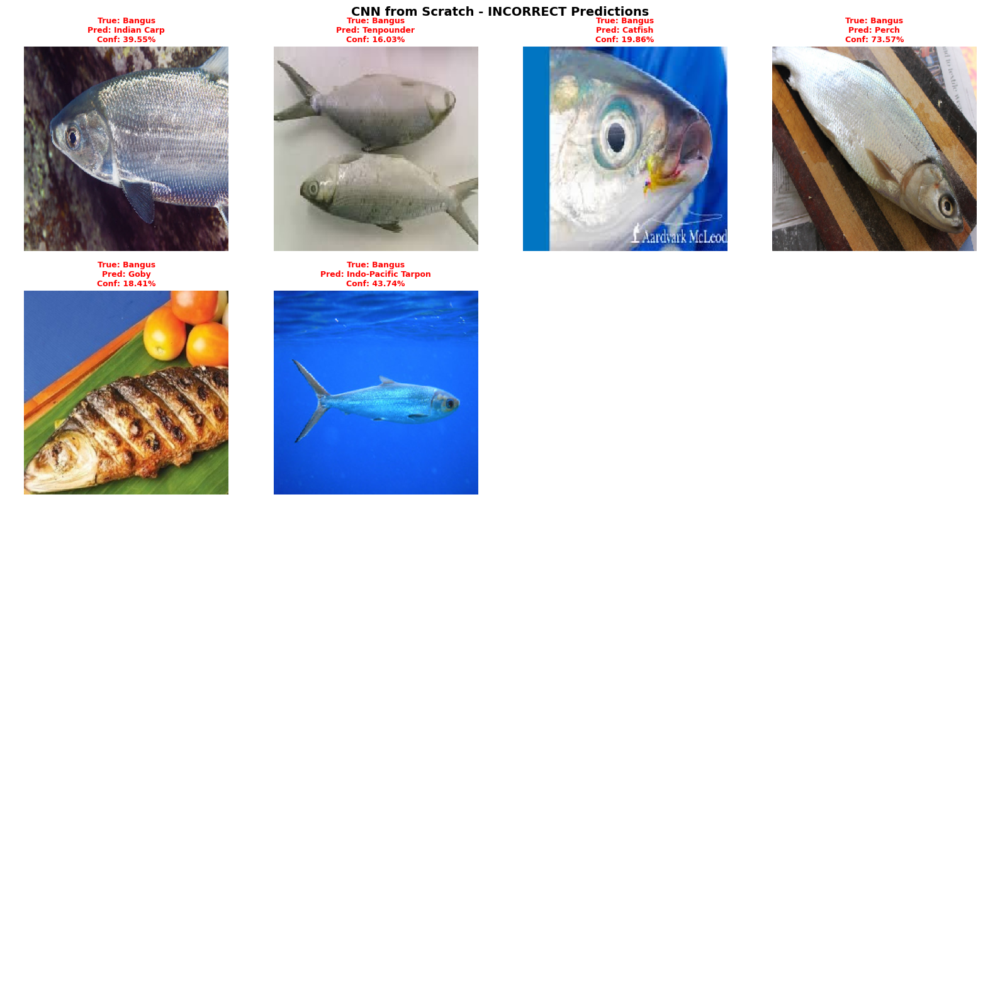


✓ Sample predictions visualized


In [44]:
# ============================================================
# VISUALIZE SAMPLE PREDICTIONS
# ============================================================

print("\n" + "="*60)
print("VISUALIZING SAMPLE PREDICTIONS")
print("="*60)

def visualize_predictions(generator, model, num_samples=16, correct_only=False, incorrect_only=False):
    """
    Visualize model predictions on sample images
    """
    # Get batch
    generator.reset()
    images, labels = next(generator)
    
    # Predict
    predictions = model.predict(images, verbose=0)
    pred_classes = np.argmax(predictions, axis=1)
    true_classes = np.argmax(labels, axis=1)
    
    # Filter samples
    if correct_only:
        indices = np.where(pred_classes == true_classes)[0]
        title_suffix = "CORRECT Predictions"
    elif incorrect_only:
        indices = np.where(pred_classes != true_classes)[0]
        title_suffix = "INCORRECT Predictions"
    else:
        indices = np.arange(len(images))
        title_suffix = "Sample Predictions"
    
    if len(indices) == 0:
        print(f"No {'correct' if correct_only else 'incorrect'} predictions in this batch")
        return
    
    # Select samples
    num_samples = min(num_samples, len(indices))
    selected_indices = np.random.choice(indices, size=num_samples, replace=False)
    
    # Plot
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    axes = axes.ravel()
    
    for i, idx in enumerate(selected_indices):
        ax = axes[i]
        ax.imshow(images[idx])
        
        true_class = idx_to_class[true_classes[idx]]
        pred_class = idx_to_class[pred_classes[idx]]
        confidence = predictions[idx][pred_classes[idx]]
        
        is_correct = pred_classes[idx] == true_classes[idx]
        color = 'green' if is_correct else 'red'
        
        ax.set_title(f'True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2%}',
                    fontsize=9, color=color, fontweight='bold')
        ax.axis('off')
    
    # Hide unused subplots
    for i in range(num_samples, 16):
        axes[i].axis('off')
    
    plt.suptitle(f'CNN from Scratch - {title_suffix}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(MODEL_SAVE_DIR, f'CNN_Scratch_{title_suffix.replace(" ", "_")}.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()

# Visualize correct predictions
print("\nVisualizing CORRECT predictions...")
visualize_predictions(test_generator, model_scratch, num_samples=16, correct_only=True)

# Visualize incorrect predictions
print("\nVisualizing INCORRECT predictions...")
visualize_predictions(test_generator, model_scratch, num_samples=16, incorrect_only=True)

print("\n✓ Sample predictions visualized")

In [45]:
# ============================================================
# BUILD TRANSFER LEARNING MODEL - EFFICIENTNETB0
# ============================================================

print("\n" + "="*60)
print("BUILDING TRANSFER LEARNING MODEL")
print("="*60)

def build_transfer_learning_model(input_shape=(224, 224, 3), num_classes=31):
    """
    Build transfer learning model using EfficientNetB0
    
    Architecture:
    - EfficientNetB0 base (pre-trained on ImageNet)
    - Custom classification head
    - Two-stage training: freeze → fine-tune
    """
    
    # Load pre-trained EfficientNetB0
    base_model = EfficientNetB0(
        include_top=False,
        weights='imagenet',
        input_shape=input_shape,
        pooling=None
    )
    
    # Freeze base model initially
    base_model.trainable = False
    
    # Build model
    model = models.Sequential(name='EfficientNetB0_FishClassifier')
    model.add(base_model)
    model.add(layers.GlobalAveragePooling2D(name='global_avg_pool'))
    
    # Custom classification head
    model.add(layers.Dense(512, name='fc1'))
    model.add(layers.BatchNormalization(name='bn_fc1'))
    model.add(layers.Activation('relu', name='relu_fc1'))
    model.add(layers.Dropout(0.5, name='dropout_fc1'))
    
    model.add(layers.Dense(256, name='fc2'))
    model.add(layers.BatchNormalization(name='bn_fc2'))
    model.add(layers.Activation('relu', name='relu_fc2'))
    model.add(layers.Dropout(0.3, name='dropout_fc2'))
    
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))
    
    return model, base_model

# Build model
print("\nBuilding EfficientNetB0 model...")
model_transfer, base_model = build_transfer_learning_model(
    input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS),
    num_classes=NUM_CLASSES
)

print("✓ Transfer learning model built successfully!\n")

# Display architecture
model_transfer.summary()

# Count parameters
total_params = model_transfer.count_params()
trainable_params = sum([tf.size(w).numpy() for w in model_transfer.trainable_weights])
frozen_params = total_params - trainable_params

print(f"\n{'='*60}")
print(f"MODEL STATISTICS")
print(f"{'='*60}")
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Frozen parameters: {frozen_params:,}")
print(f"Base model: EfficientNetB0 (ImageNet pre-trained)")
print(f"Custom layers: 2 Dense + BatchNorm + Dropout")


BUILDING TRANSFER LEARNING MODEL

Building EfficientNetB0 model...
16705208/16705208 [==============================] - 2s 0us/step
✓ Transfer learning model built successfully!

Model: "EfficientNetB0_FishClassifier"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional  (None, 7, 7, 1280)        4049571   
 )                                                               
                                                                 
 global_avg_pool (GlobalAve  (None, 1280)              0         
 ragePooling2D)                                                  
                                                                 
 fc1 (Dense)                 (None, 512)               655872    
                                                                 
 bn_fc1 (BatchNormalization  (None, 512)               2048      
 )                                                     

In [46]:
# ============================================================
# COMPILE MODEL - STAGE 1 (FROZEN BASE)
# ============================================================

print("\n" + "="*60)
print("COMPILING MODEL - STAGE 1 (HEAD TRAINING)")
print("="*60)

# Stage 1: Higher learning rate for head training
stage1_lr = 0.001
optimizer_stage1 = keras.optimizers.Adam(learning_rate=stage1_lr)

# Compile model
model_transfer.compile(
    optimizer=optimizer_stage1,
    loss='categorical_crossentropy',
    metrics=[
        'accuracy',
        keras.metrics.TopKCategoricalAccuracy(k=3, name='top3_accuracy'),
        keras.metrics.Precision(name='precision'),
        keras.metrics.Recall(name='recall')
    ]
)

print(f"\n✓ Model compiled for Stage 1!")
print(f"\nStage 1 Configuration:")
print(f"  Base model: FROZEN (not trainable)")
print(f"  Training: Classification head only")
print(f"  Learning rate: {stage1_lr}")
print(f"  Optimizer: Adam")
print(f"  Epochs: {EPOCHS_TRANSFER_STAGE1}")


COMPILING MODEL - STAGE 1 (HEAD TRAINING)

✓ Model compiled for Stage 1!

Stage 1 Configuration:
  Base model: FROZEN (not trainable)
  Training: Classification head only
  Learning rate: 0.001
  Optimizer: Adam
  Epochs: 5


In [47]:
# ============================================================
# SETUP CALLBACKS - STAGE 1
# ============================================================

print("\n" + "="*60)
print("CONFIGURING CALLBACKS - STAGE 1")
print("="*60)

# Stage 1 callbacks
checkpoint_stage1 = ModelCheckpoint(
    filepath=os.path.join(MODEL_SAVE_DIR, 'transfer_stage1_best.keras'),
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

early_stopping_stage1 = EarlyStopping(
    monitor='val_loss',
    patience=3,  # Shorter patience for stage 1
    restore_best_weights=True,
    verbose=1
)

reduce_lr_stage1 = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=2,
    min_lr=1e-7,
    verbose=1
)

csv_logger_stage1 = keras.callbacks.CSVLogger(
    os.path.join(MODEL_SAVE_DIR, 'transfer_stage1_log.csv')
)

callbacks_stage1 = [
    checkpoint_stage1,
    early_stopping_stage1,
    reduce_lr_stage1,
    csv_logger_stage1
]

print("\n✓ Stage 1 callbacks configured")


CONFIGURING CALLBACKS - STAGE 1

✓ Stage 1 callbacks configured


In [48]:
# ============================================================
# TRAIN STAGE 1 - CLASSIFICATION HEAD ONLY
# ============================================================

print("\n" + "="*60)
print("TRAINING STAGE 1 - CLASSIFICATION HEAD")
print("="*60)

print(f"\nStage 1 Training Configuration:")
print(f"  Training samples: {train_generator_transfer.samples}")
print(f"  Validation samples: {val_generator_transfer.samples}")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Epochs: {EPOCHS_TRANSFER_STAGE1}")
print(f"  Base model: FROZEN")
print(f"  Class weights: Applied")

print(f"\n{'='*60}")
print("Stage 1 Training in progress... (~5-10 minutes)")
print(f"{'='*60}\n")

# Train Stage 1
history_stage1 = model_transfer.fit(
    train_generator_transfer,
    steps_per_epoch=len(train_generator_transfer),
    epochs=EPOCHS_TRANSFER_STAGE1,
    validation_data=val_generator_transfer,
    validation_steps=len(val_generator_transfer),
    class_weight=class_weights_dict,
    callbacks=callbacks_stage1,
    verbose=1
)

print(f"\n{'='*60}")
print("✓ STAGE 1 TRAINING COMPLETE!")
print(f"{'='*60}")

# Stage 1 results
stage1_train_acc = history_stage1.history['accuracy'][-1]
stage1_val_acc = history_stage1.history['val_accuracy'][-1]

print(f"\nStage 1 Final Metrics:")
print(f"  Training Accuracy: {stage1_train_acc:.4f}")
print(f"  Validation Accuracy: {stage1_val_acc:.4f}")


TRAINING STAGE 1 - CLASSIFICATION HEAD

Stage 1 Training Configuration:
  Training samples: 8801
  Validation samples: 2751
  Batch size: 32
  Epochs: 5
  Base model: FROZEN
  Class weights: Applied

Stage 1 Training in progress... (~5-10 minutes)

Epoch 1/5
276/276 [==============================] - ETA: 0s - loss: 1.6795 - accuracy: 0.5364 - top3_accuracy: 0.7414 - precision: 0.8536 - recall: 0.3133
Epoch 1: val_accuracy improved from -inf to 0.82879, saving model to C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\models\transfer_stage1_best.keras
276/276 [==============================] - 239s 844ms/step - loss: 1.6795 - accuracy: 0.5364 - top3_accuracy: 0.7414 - precision: 0.8536 - recall: 0.3133 - val_loss: 0.6145 - val_accuracy: 0.8288 - val_top3_accuracy: 0.9491 - val_precision: 0.9335 - val_recall: 0.7146 - lr: 0.0010
Epoch 2/5
276/276 [==============================] - ETA: 0s - loss: 0.9050 - accuracy: 0.7418 - top3_accuracy: 0.9043 - precision: 

In [49]:
# ============================================================
# PREPARE FOR STAGE 2 - FINE-TUNING
# ============================================================

print("\n" + "="*60)
print("PREPARING FOR STAGE 2 - FINE-TUNING")
print("="*60)

# Unfreeze last N layers of base model
UNFREEZE_LAYERS = 50  # Unfreeze last 50 layers

print(f"\nUnfreezing strategy:")
print(f"  Total base model layers: {len(base_model.layers)}")
print(f"  Layers to unfreeze: {UNFREEZE_LAYERS}")
print(f"  Layers to keep frozen: {len(base_model.layers) - UNFREEZE_LAYERS}")

# Unfreeze base model
base_model.trainable = True

# Freeze early layers, unfreeze later layers
for layer in base_model.layers[:-UNFREEZE_LAYERS]:
    layer.trainable = False

for layer in base_model.layers[-UNFREEZE_LAYERS:]:
    layer.trainable = True

# Count trainable parameters
trainable_params = sum([tf.size(w).numpy() for w in model_transfer.trainable_weights])
total_params = model_transfer.count_params()

print(f"\nParameter update:")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")
print(f"  Frozen parameters: {total_params - trainable_params:,}")
print(f"  Trainable ratio: {trainable_params/total_params*100:.1f}%")

print("\n✓ Model prepared for fine-tuning")


PREPARING FOR STAGE 2 - FINE-TUNING

Unfreezing strategy:
  Total base model layers: 238
  Layers to unfreeze: 50
  Layers to keep frozen: 188

Parameter update:
  Total parameters: 4,847,810
  Trainable parameters: 3,323,567
  Frozen parameters: 1,524,243
  Trainable ratio: 68.6%

✓ Model prepared for fine-tuning


In [50]:
# ============================================================
# COMPILE MODEL - STAGE 2 (FINE-TUNING)
# ============================================================

print("\n" + "="*60)
print("COMPILING MODEL - STAGE 2 (FINE-TUNING)")
print("="*60)

# Stage 2: Much lower learning rate for fine-tuning
stage2_lr = 1e-5  # Very low to prevent destroying pre-trained weights
optimizer_stage2 = keras.optimizers.Adam(learning_rate=stage2_lr)

# Recompile model with new optimizer
model_transfer.compile(
    optimizer=optimizer_stage2,
    loss='categorical_crossentropy',
    metrics=[
        'accuracy',
        keras.metrics.TopKCategoricalAccuracy(k=3, name='top3_accuracy'),
        keras.metrics.Precision(name='precision'),
        keras.metrics.Recall(name='recall')
    ]
)

print(f"\n✓ Model compiled for Stage 2!")
print(f"\nStage 2 Configuration:")
print(f"  Base model: PARTIALLY UNFROZEN ({UNFREEZE_LAYERS} layers)")
print(f"  Learning rate: {stage2_lr} (100x lower than Stage 1)")
print(f"  Optimizer: Adam")
print(f"  Epochs: {EPOCHS_TRANSFER_STAGE2}")
print(f"  Strategy: Fine-tune entire network end-to-end")


COMPILING MODEL - STAGE 2 (FINE-TUNING)

✓ Model compiled for Stage 2!

Stage 2 Configuration:
  Base model: PARTIALLY UNFROZEN (50 layers)
  Learning rate: 1e-05 (100x lower than Stage 1)
  Optimizer: Adam
  Epochs: 15
  Strategy: Fine-tune entire network end-to-end


In [51]:
# ============================================================
# SETUP CALLBACKS - STAGE 2
# ============================================================

print("\n" + "="*60)
print("CONFIGURING CALLBACKS - STAGE 2")
print("="*60)

# Stage 2 callbacks
checkpoint_stage2 = ModelCheckpoint(
    filepath=os.path.join(MODEL_SAVE_DIR, 'transfer_stage2_best.keras'),
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

early_stopping_stage2 = EarlyStopping(
    monitor='val_loss',
    patience=7,  # Longer patience for fine-tuning
    restore_best_weights=True,
    verbose=1
)

reduce_lr_stage2 = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-8,
    verbose=1
)

csv_logger_stage2 = keras.callbacks.CSVLogger(
    os.path.join(MODEL_SAVE_DIR, 'transfer_stage2_log.csv')
)

callbacks_stage2 = [
    checkpoint_stage2,
    early_stopping_stage2,
    reduce_lr_stage2,
    csv_logger_stage2
]

print("\n✓ Stage 2 callbacks configured")


CONFIGURING CALLBACKS - STAGE 2

✓ Stage 2 callbacks configured


In [52]:
# ============================================================
# TRAIN STAGE 2 - FINE-TUNING
# ============================================================

print("\n" + "="*60)
print("TRAINING STAGE 2 - FINE-TUNING")
print("="*60)

print(f"\nStage 2 Training Configuration:")
print(f"  Training samples: {train_generator_transfer.samples}")
print(f"  Validation samples: {val_generator_transfer.samples}")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Epochs: {EPOCHS_TRANSFER_STAGE2}")
print(f"  Unfrozen layers: {UNFREEZE_LAYERS}")
print(f"  Learning rate: {stage2_lr}")
print(f"  Class weights: Applied")

print(f"\n{'='*60}")
print("Stage 2 Training in progress... (~15-30 minutes)")
print(f"{'='*60}\n")

# Train Stage 2
history_stage2 = model_transfer.fit(
    train_generator_transfer,
    steps_per_epoch=len(train_generator_transfer),
    epochs=EPOCHS_TRANSFER_STAGE2,
    validation_data=val_generator_transfer,
    validation_steps=len(val_generator_transfer),
    class_weight=class_weights_dict,
    callbacks=callbacks_stage2,
    verbose=1
)

print(f"\n{'='*60}")
print("✓ STAGE 2 TRAINING COMPLETE!")
print(f"{'='*60}")

# Stage 2 results
stage2_train_acc = history_stage2.history['accuracy'][-1]
stage2_val_acc = history_stage2.history['val_accuracy'][-1]

print(f"\nStage 2 Final Metrics:")
print(f"  Training Accuracy: {stage2_train_acc:.4f}")
print(f"  Validation Accuracy: {stage2_val_acc:.4f}")

# Best epoch
best_epoch_stage2 = np.argmax(history_stage2.history['val_accuracy']) + 1
best_val_acc_stage2 = max(history_stage2.history['val_accuracy'])

print(f"\nBest Model (Stage 2):")
print(f"  Best epoch: {best_epoch_stage2}")
print(f"  Best validation accuracy: {best_val_acc_stage2:.4f}")


TRAINING STAGE 2 - FINE-TUNING

Stage 2 Training Configuration:
  Training samples: 8801
  Validation samples: 2751
  Batch size: 32
  Epochs: 15
  Unfrozen layers: 50
  Learning rate: 1e-05
  Class weights: Applied

Stage 2 Training in progress... (~15-30 minutes)

Epoch 1/15
276/276 [==============================] - ETA: 0s - loss: 0.8031 - accuracy: 0.7473 - top3_accuracy: 0.9077 - precision: 0.8406 - recall: 0.6742
Epoch 1: val_accuracy improved from -inf to 0.90440, saving model to C:\Users\hamda\OneDrive\Documents\SEMESTER 7\MACHINE LEARNING\classification\models\transfer_stage2_best.keras
276/276 [==============================] - 279s 976ms/step - loss: 0.8031 - accuracy: 0.7473 - top3_accuracy: 0.9077 - precision: 0.8406 - recall: 0.6742 - val_loss: 0.3037 - val_accuracy: 0.9044 - val_top3_accuracy: 0.9807 - val_precision: 0.9401 - val_recall: 0.8735 - lr: 1.0000e-05
Epoch 2/15
276/276 [==============================] - ETA: 0s - loss: 0.7043 - accuracy: 0.7868 - top3_accura

In [53]:
# ============================================================
# COMBINE STAGE 1 & 2 TRAINING HISTORIES
# ============================================================

print("\n" + "="*60)
print("COMBINING TRAINING HISTORIES")
print("="*60)

# Combine histories
combined_history = {}

for key in history_stage1.history.keys():
    combined_history[key] = history_stage1.history[key] + history_stage2.history[key]

# Create a combined history object (for plotting)
class CombinedHistory:
    def __init__(self, history_dict):
        self.history = history_dict

history_transfer = CombinedHistory(combined_history)

print(f"\n✓ Training histories combined")
print(f"  Stage 1 epochs: {len(history_stage1.history['accuracy'])}")
print(f"  Stage 2 epochs: {len(history_stage2.history['accuracy'])}")
print(f"  Total epochs: {len(combined_history['accuracy'])}")

# Overall best performance
best_epoch_overall = np.argmax(combined_history['val_accuracy']) + 1
best_val_acc_overall = max(combined_history['val_accuracy'])

print(f"\nOverall Best Performance:")
print(f"  Best epoch: {best_epoch_overall}")
print(f"  Best validation accuracy: {best_val_acc_overall:.4f}")


COMBINING TRAINING HISTORIES

✓ Training histories combined
  Stage 1 epochs: 5
  Stage 2 epochs: 15
  Total epochs: 20

Overall Best Performance:
  Best epoch: 20
  Best validation accuracy: 0.9535



VISUALIZING TRANSFER LEARNING HISTORY


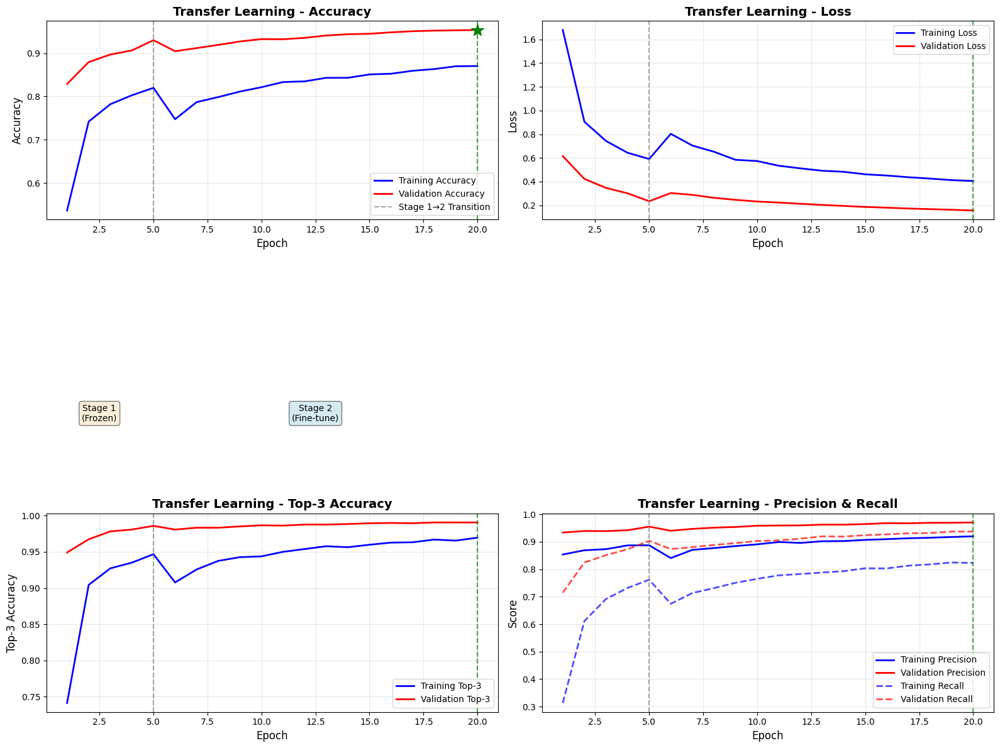


✓ Transfer learning history visualized


In [54]:
# ============================================================
# VISUALIZE TRANSFER LEARNING HISTORY
# ============================================================

print("\n" + "="*60)
print("VISUALIZING TRANSFER LEARNING HISTORY")
print("="*60)

def plot_transfer_learning_history(history, stage1_epochs):
    """
    Plot combined training history with stage separation
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    epochs_range = range(1, len(history.history['accuracy']) + 1)
    
    # 1. Accuracy
    ax1 = axes[0, 0]
    ax1.plot(epochs_range, history.history['accuracy'], 'b-', label='Training Accuracy', linewidth=2)
    ax1.plot(epochs_range, history.history['val_accuracy'], 'r-', label='Validation Accuracy', linewidth=2)
    ax1.axvline(x=stage1_epochs, color='gray', linestyle='--', alpha=0.7, label='Stage 1→2 Transition')
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.set_title('Transfer Learning - Accuracy', fontsize=14, fontweight='bold')
    ax1.legend(loc='lower right')
    ax1.grid(True, alpha=0.3)
    
    # Mark best epoch
    best_epoch = np.argmax(history.history['val_accuracy']) + 1
    best_val_acc = max(history.history['val_accuracy'])
    ax1.axvline(x=best_epoch, color='g', linestyle='--', alpha=0.7, label=f'Best: {best_epoch}')
    ax1.plot(best_epoch, best_val_acc, 'g*', markersize=15)
    
    # Add stage annotations
    ax1.text(stage1_epochs/2, 0.05, 'Stage 1\n(Frozen)', ha='center', fontsize=10, 
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    ax1.text(stage1_epochs + (len(epochs_range)-stage1_epochs)/2, 0.05, 'Stage 2\n(Fine-tune)', 
             ha='center', fontsize=10, bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5))
    
    # 2. Loss
    ax2 = axes[0, 1]
    ax2.plot(epochs_range, history.history['loss'], 'b-', label='Training Loss', linewidth=2)
    ax2.plot(epochs_range, history.history['val_loss'], 'r-', label='Validation Loss', linewidth=2)
    ax2.axvline(x=stage1_epochs, color='gray', linestyle='--', alpha=0.7)
    ax2.axvline(x=best_epoch, color='g', linestyle='--', alpha=0.7)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.set_title('Transfer Learning - Loss', fontsize=14, fontweight='bold')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3)
    
    # 3. Top-3 Accuracy
    ax3 = axes[1, 0]
    ax3.plot(epochs_range, history.history['top3_accuracy'], 'b-', label='Training Top-3', linewidth=2)
    ax3.plot(epochs_range, history.history['val_top3_accuracy'], 'r-', label='Validation Top-3', linewidth=2)
    ax3.axvline(x=stage1_epochs, color='gray', linestyle='--', alpha=0.7)
    ax3.axvline(x=best_epoch, color='g', linestyle='--', alpha=0.7)
    ax3.set_xlabel('Epoch', fontsize=12)
    ax3.set_ylabel('Top-3 Accuracy', fontsize=12)
    ax3.set_title('Transfer Learning - Top-3 Accuracy', fontsize=14, fontweight='bold')
    ax3.legend(loc='lower right')
    ax3.grid(True, alpha=0.3)
    
    # 4. Precision & Recall
    ax4 = axes[1, 1]
    ax4.plot(epochs_range, history.history['precision'], 'b-', label='Training Precision', linewidth=2)
    ax4.plot(epochs_range, history.history['val_precision'], 'r-', label='Validation Precision', linewidth=2)
    ax4.plot(epochs_range, history.history['recall'], 'b--', label='Training Recall', linewidth=2, alpha=0.7)
    ax4.plot(epochs_range, history.history['val_recall'], 'r--', label='Validation Recall', linewidth=2, alpha=0.7)
    ax4.axvline(x=stage1_epochs, color='gray', linestyle='--', alpha=0.7)
    ax4.axvline(x=best_epoch, color='g', linestyle='--', alpha=0.7)
    ax4.set_xlabel('Epoch', fontsize=12)
    ax4.set_ylabel('Score', fontsize=12)
    ax4.set_title('Transfer Learning - Precision & Recall', fontsize=14, fontweight='bold')
    ax4.legend(loc='lower right')
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(MODEL_SAVE_DIR, 'Transfer_Learning_training_history.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()

# Plot combined history
stage1_epochs_count = len(history_stage1.history['accuracy'])
plot_transfer_learning_history(history_transfer, stage1_epochs_count)

print("\n✓ Transfer learning history visualized")

In [55]:
# ============================================================
# EVALUATE TRANSFER LEARNING ON TEST SET
# ============================================================

print("\n" + "="*60)
print("EVALUATING TRANSFER LEARNING ON TEST SET")
print("="*60)

# Evaluate model
print("\nEvaluating model on test set...")
test_results_transfer = model_transfer.evaluate(
    test_generator_transfer,
    steps=len(test_generator_transfer),
    verbose=1
)

# Display results
print(f"\n{'='*60}")
print("TRANSFER LEARNING - TEST SET RESULTS")
print(f"{'='*60}")
print(f"Test Loss: {test_results_transfer[0]:.4f}")
print(f"Test Accuracy: {test_results_transfer[1]:.4f}")
print(f"Test Top-3 Accuracy: {test_results_transfer[2]:.4f}")
print(f"Test Precision: {test_results_transfer[3]:.4f}")
print(f"Test Recall: {test_results_transfer[4]:.4f}")

# Calculate F1-Score
test_f1_transfer = 2 * (test_results_transfer[3] * test_results_transfer[4]) / \
                   (test_results_transfer[3] + test_results_transfer[4])
print(f"Test F1-Score: {test_f1_transfer:.4f}")


EVALUATING TRANSFER LEARNING ON TEST SET

Evaluating model on test set...
55/55 [==============================] - 24s 441ms/step - loss: 0.1622 - accuracy: 0.9523 - top3_accuracy: 0.9915 - precision: 0.9717 - recall: 0.9364

TRANSFER LEARNING - TEST SET RESULTS
Test Loss: 0.1622
Test Accuracy: 0.9523
Test Top-3 Accuracy: 0.9915
Test Precision: 0.9717
Test Recall: 0.9364
Test F1-Score: 0.9537
